In [1]:
import pandas as pd
import datetime as dt
import numpy as np
import numpy as np
import netCDF4 as nc
import xarray as xr

import pandas as pd
import metpy
import metpy.calc as mpcalc
from metpy.cbook import get_test_data
from metpy.units import units
import matplotlib.pyplot as plt


## Badgery

## station data

In [65]:
df_bd = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/BadgerysCreek_HD01D_Data_067108_HourlyMaxWG.txt")

In [66]:
df_bd = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/BadgerysCreek_HD01D_Data_067108_HourlyMaxWG.txt", usecols=[
            "YearMonthDayHourMinutesInYYYY",
            "MM_1",
            "DD_1",
            "HH24_1",
            "MIFormatInUniversalCoordinatedTime",
            #"MM",
            #"DD",
            "HH24",
            "MIFormatInLocalStandardTime",
            "MaxHourlyGustInKm_h"])

In [67]:
df1=df_bd[df_bd['YearMonthDayHourMinutesInYYYY']>=2001]
df2=df1[df1['YearMonthDayHourMinutesInYYYY']<=2019]

df3=df2[df2['MM_1'].isin([1,2,11,12])]
df4=df3[df3['HH24_1'].isin([1,2,3,4,5,6,7,8])]

In [68]:
df5=df4.reset_index(drop=True)

In [69]:
test_bd = df5
test_bd["MaxHourlyGustInm_s"] = df5['MaxHourlyGustInKm_h']* 5/18

In [70]:
import datetime
test_bd["Time"] = test_bd["YearMonthDayHourMinutesInYYYY"].astype(str) + "-" + test_bd["MM_1"].astype(str) + "-" + test_bd["DD_1"].astype(str) + "T" + test_bd['HH24_1'].astype(str) +":"+ "00"+":"+ "00"
test_bd["clean_time"] = test_bd["Time"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S"))

## Richmond

## station data

In [71]:
df_rich = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/Richmond_HD01D_Data_067105_HourlyMaxWG.txt")

In [72]:
df_rich = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/Richmond_HD01D_Data_067105_HourlyMaxWG.txt", usecols=[
            "YearMonthDayHourMinutesInYYYY",
            "MM_1",
            "DD_1",
            "HH24_1",
            "MIFormatInUniversalCoordinatedTime",
            #"MM",
            #"DD",
            "HH24",
            "MIFormatInLocalStandardTime",
            "MaxHourlyGustInKm_h"])

In [73]:
df1=df_rich[df_rich['YearMonthDayHourMinutesInYYYY']>=2001]
df2=df1[df1['YearMonthDayHourMinutesInYYYY']<=2019]


df3=df2[df2['MM_1'].isin([1,2,11,12])]
df4=df3[df3['HH24_1'].isin([1,2,3,4,5,6,7,8])]

In [74]:
df5=df4.reset_index(drop=True)

In [75]:
len(df5)

18162

In [76]:
test_ri = df5
test_ri["MaxHourlyGustInm_s"] = df5['MaxHourlyGustInKm_h']* 5/18

len(test_ri)

18162

In [77]:
import datetime
test_ri["Time"] = test_ri["YearMonthDayHourMinutesInYYYY"].astype(str) + "-" + test_ri["MM_1"].astype(str) + "-" + test_ri["DD_1"].astype(str) + "T" + test_ri['HH24_1'].astype(str) +":"+ "00"+":"+ "00"
test_ri["clean_time"] = test_ri["Time"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S"))

## moree

## station data

In [78]:
df_moree = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/MoreeAirport_HD01D_Data_053115_HourlyMaxWG.txt")

In [79]:
df_moree = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/MoreeAirport_HD01D_Data_053115_HourlyMaxWG.txt", usecols=[
            "YearMonthDayHourMinutesInYYYY",
            "MM_1",
            "DD_1",
            "HH24_1",
            "MIFormatInUniversalCoordinatedTime",
            #"MM",
            #"DD",
            "HH24",
            "MIFormatInLocalStandardTime",
            "MaxHourlyGustInKm_h"])


In [80]:
df1=df_moree[df_moree['YearMonthDayHourMinutesInYYYY']>=2001]
df2=df1[df1['YearMonthDayHourMinutesInYYYY']<=2019]


df3=df2[df2['MM_1'].isin([1,2,11,12])]
df4=df3[df3['HH24_1'].isin([1,2,3,4,5,6,7,8])]

In [81]:
df5=df4.reset_index(drop=True)

In [82]:
test_mo = df5
test_mo["MaxHourlyGustInm_s"] = df5['MaxHourlyGustInKm_h']* 5/18


In [83]:
import datetime
test_mo["Time"] = test_mo["YearMonthDayHourMinutesInYYYY"].astype(str) + "-" + test_mo["MM_1"].astype(str) + "-" + test_mo["DD_1"].astype(str) + "T" + test_mo['HH24_1'].astype(str) +":"+ "00"+":"+ "00"
test_mo["clean_time"] = test_mo["Time"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S"))

## syd airport

## station data

In [84]:
df_sy = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/SydneyAirport_HD01D_Data_066037_HourlyMaxWG.txt")

In [85]:
df_sy = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/SydneyAirport_HD01D_Data_066037_HourlyMaxWG.txt", usecols=[
            "YearMonthDayHourMinutesInYYYY",
            "MM_1",
            "DD_1",
            "HH24_1",
            "MIFormatInUniversalCoordinatedTime",
            #"MM",
            #"DD",
            "HH24",
            "MIFormatInLocalStandardTime",
            "MaxHourlyGustInKm_h"])

In [86]:
df1=df_sy[df_sy['YearMonthDayHourMinutesInYYYY']>=2001]
df2=df1[df1['YearMonthDayHourMinutesInYYYY']<=2019]


df3=df2[df2['MM_1'].isin([1,2,11,12])]
df4=df3[df3['HH24_1'].isin([1,2,3,4,5,6,7,8])]


In [87]:
df5=df4.reset_index(drop=True)

In [88]:
test_sy = df5
test_sy["MaxHourlyGustInm_s"] = df5['MaxHourlyGustInKm_h']* 5/18


In [89]:
import datetime
test_sy["Time"] = test_sy["YearMonthDayHourMinutesInYYYY"].astype(str) + "-" + test_sy["MM_1"].astype(str) + "-" + test_sy["DD_1"].astype(str) + "T" + test_sy['HH24_1'].astype(str) +":"+ "00"+":"+ "00"
test_sy["clean_time"] = test_sy["Time"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S"))


## tamworth

## station data

In [90]:
df_tm = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/TamworthAirport_HD01D_Data_055325_HourlyMaxWG.txt")

In [91]:
df_tm = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/TamworthAirport_HD01D_Data_055325_HourlyMaxWG.txt", usecols=[
            "YearMonthDayHourMinutesInYYYY",
            "MM_1",
            "DD_1",
            "HH24_1",
            "MIFormatInUniversalCoordinatedTime",
            #"MM",
            #"DD",
            "HH24",
            "MIFormatInLocalStandardTime",
            "MaxHourlyGustInKm_h"])


In [92]:
df1=df_tm[df_tm['YearMonthDayHourMinutesInYYYY']>=2001]
df2=df1[df1['YearMonthDayHourMinutesInYYYY']<=2019]


df3=df2[df2['MM_1'].isin([1,2,11,12])]
df4=df3[df3['HH24_1'].isin([1,2,3,4,5,6,7,8])]

In [93]:
df5=df4.reset_index(drop=True)

In [94]:
test_tm = df5
test_tm["MaxHourlyGustInm_s"] = df5['MaxHourlyGustInKm_h']* 5/18


In [95]:
import datetime
test_tm["Time"] = test_tm["YearMonthDayHourMinutesInYYYY"].astype(str) + "-" + test_tm["MM_1"].astype(str) + "-" + test_tm["DD_1"].astype(str) + "T" + test_tm['HH24_1'].astype(str) +":"+ "00"+":"+ "00"
test_tm["clean_time"] = test_tm["Time"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S"))

## wagga

In [96]:
## station data

In [97]:
df_wa = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/WaggaWagga_HD01D_Data_072150_HourlyMaxWG.txt")


In [98]:
df_wa = pd.read_table("/g/data/up6/gs5098/ERA5 indices time series/DP and HrMax txt files/WaggaWagga_HD01D_Data_072150_HourlyMaxWG.txt", usecols=[
            "YearMonthDayHourMinutesInYYYY",
            "MM_1",
            "DD_1",
            "HH24_1",
            "MIFormatInUniversalCoordinatedTime",
            #"MM",
            #"DD",
            "HH24",
            "MIFormatInLocalStandardTime",
            "MaxHourlyGustInKm_h"])

In [99]:
df1=df_wa[df_wa['YearMonthDayHourMinutesInYYYY']>=2001]
df2=df1[df1['YearMonthDayHourMinutesInYYYY']<=2019]


df3=df2[df2['MM_1'].isin([1,2,11,12])]
df4=df3[df3['HH24_1'].isin([1,2,3,4,5,6,7,8])]

In [100]:
df5=df4.reset_index(drop=True)

In [101]:
test_wa = df5
test_wa["MaxHourlyGustInm_s"] = df5['MaxHourlyGustInKm_h']* 5/18



In [102]:
import datetime
test_wa["Time"] = test_wa["YearMonthDayHourMinutesInYYYY"].astype(str) + "-" + test_wa["MM_1"].astype(str) + "-" + test_wa["DD_1"].astype(str) + "T" + test_wa['HH24_1'].astype(str) +":"+ "00"+":"+ "00"
test_wa["clean_time"] = test_wa["Time"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S"))


## Loading diagnostics datasets

In [2]:
richmond_data_1 = xr.open_dataset('/g/data/up6/gs5098/SCW-analysis/read_model_data/data/Richmond/ric_dig.nc')
sydney_data_1 = xr.open_dataset('/g/data/up6/gs5098/SCW-analysis/read_model_data/data/Sydney/syd_dig.nc')
badgery_data_1 = xr.open_dataset('/g/data/up6/gs5098/SCW-analysis/read_model_data/data/Badgery/bad_dig.nc')
wagga_data_1 = xr.open_dataset('/g/data/up6/gs5098/SCW-analysis/read_model_data/data/Wagga/wag_dig.nc')
moree_data_1 = xr.open_dataset('/g/data/up6/gs5098/SCW-analysis/read_model_data/data/Moree/mor_dig.nc')
tamworth_data_1 = xr.open_dataset('/g/data/up6/gs5098/SCW-analysis/read_model_data/data/Tamworth/tam_dig.nc')

In [3]:
richmond_data = richmond_data_1.sel(lat = -33.60, lon = 150.78, method = 'nearest')
sydney_data = sydney_data_1.sel(lat =  -33.95, lon = 151.17, method = 'nearest')
badgery_data = badgery_data_1.sel(lat =  -33.90, lon = 150.73, method = 'nearest')
wagga_data = wagga_data_1.sel(lat =  -35.16, lon = 147.46, method = 'nearest')
moree_data = moree_data_1.sel(lat =  -29.49, lon = 149.85, method = 'nearest')
tamworth_data = tamworth_data_1.sel(lat =  -31.07, lon = 150.84, method = 'nearest')

In [4]:
richmond_data

<xarray.Dataset> Size: 10MB
Dimensions:         (time: 17928)
Coordinates:
  * time            (time) datetime64[ns] 143kB 2001-01-01T01:00:00 ... 2019-...
    lon             float32 4B 150.8
    lat             float32 4B -33.59
Data variables: (12/132)
    ml_cape         (time) float32 72kB ...
    mu_cape         (time) float32 72kB ...
    sb_cape         (time) float32 72kB ...
    ml_cin          (time) float32 72kB ...
    sb_cin          (time) float32 72kB ...
    mu_cin          (time) float32 72kB ...
    ...              ...
    ta975           (time) float32 72kB ...
    rh900           (time) float32 72kB ...
    rh850           (time) float32 72kB ...
    sfc_ta          (time) float32 72kB ...
    sfc_dp          (time) float32 72kB ...
    inverted_v      (time) float32 72kB ...
Attributes:
    CDI:          Climate Data Interface version 2.0.5 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Tue Mar 05 10:17:01 2024: cdo -r -f nc4 -L selyear,2001/201...
    CDO:          Climate Data Operators version 2.0.5 (https://mpimet.mpg.de...

In [105]:
variable_names = list(richmond_data.variables.keys())

# Display the array of variable names
print(variable_names)


['time', 'lon', 'lat', 'ml_cape', 'mu_cape', 'sb_cape', 'ml_cin', 'sb_cin', 'mu_cin', 'ml_lcl', 'mu_lcl', 'sb_lcl', 'eff_cape', 'eff_cin', 'eff_lcl', 'lr01', 'lr03', 'lr13', 'lr36', 'lr24', 'lr_freezing', 'lr_subcloud', 'lr700_500', 'qmean01', 'qmean03', 'qmean06', 'muq', 'ta500', 'ta850', 'dp850', 'qmean0500', 'q2m', 'qmeansubcloud', 'q_melting', 'q1', 'q3', 'q6', 'rhmin01', 'rhmin03', 'rhmin13', 'rhmean01', 'rhminsubcloud', 'tei', 'wbz', 'mhgt', 'mu_el', 'ml_el', 'sb_el', 'eff_el', 'pwat', 'v_totals', 'c_totals', 't_totals', 'te_diff', 'dpd850', 'dpd700', 'dcape', 'ddraft_temp', 'sfc_thetae', 'srhe_left', 'srh01_left', 'srh03_left', 'srh06_left', 'ebwd', 's010', 's06', 's03', 's01', 's13', 's36', 'scld', 'U500', 'U10', 'U1', 'U3', 'U6', 'Ust_left', 'Usr01_left', 'Usr03_left', 'Usr06_left', 'Uwindinf', 'Umeanwindinf', 'Umean800_600', 'Umean06', 'Umean01', 'Umean03', 'wg10', 'dcp', 'stp_cin_left', 'stp_fixed_left', 'scp', 'scp_fixed', 'ship', 'mlcape*s06', 'mucape*s06', 'sbcape*s06', '

In [106]:
variable_names = ['time','ml_cape', 'mu_cape', 'eff_cape', 'lr13', 
                  'qmean01', 'rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting', 'mlcape*s06',  'ebwd',  's06',  'Umean800_600', 
                  'Umean06', 'wg10', 'dcp', 'scp',   'gustex', 'eff_sherb', 'k_index', 
                  'bdsd', 'inverted_v', 'ta900','rh900' ]

In [107]:
df_wa = pd.DataFrame({var_name: wagga_data[var_name] for var_name in variable_names})
df_sy = pd.DataFrame({var_name: sydney_data[var_name] for var_name in variable_names})
df_mo = pd.DataFrame({var_name: moree_data[var_name] for var_name in variable_names})
df_tm = pd.DataFrame({var_name: tamworth_data[var_name] for var_name in variable_names})
df_bd = pd.DataFrame({var_name: badgery_data[var_name] for var_name in variable_names})
df_ri = pd.DataFrame({var_name: richmond_data[var_name] for var_name in variable_names})

In [108]:
new_frame_wa = test_wa.merge(df_wa,how='left', left_on='clean_time', right_on='time')
new_frame_wa_nad = new_frame_wa.dropna()

new_frame_sy = test_sy.merge(df_sy,how='left', left_on='clean_time', right_on='time')
new_frame_sy_nad = new_frame_sy.dropna()

new_frame_mo = test_mo.merge(df_mo,how='left', left_on='clean_time', right_on='time')
new_frame_mo_nad = new_frame_mo.dropna()

new_frame_tm = test_tm.merge(df_tm,how='left', left_on='clean_time', right_on='time')
new_frame_tm_nad = new_frame_tm.dropna()

new_frame_bd = test_bd.merge(df_bd,how='left', left_on='clean_time', right_on='time')
new_frame_bd_nad = new_frame_bd.dropna()

new_frame_ri = test_ri.merge(df_ri,how='left', left_on='clean_time', right_on='time')
new_frame_ri_nad = new_frame_ri.dropna()

In [109]:
sy_strong_nad=new_frame_sy_nad[new_frame_sy_nad['MaxHourlyGustInm_s']>=18]
sy_extreme_nad = new_frame_sy_nad[new_frame_sy_nad['MaxHourlyGustInm_s']>=25]

wa_strong_nad=new_frame_wa_nad[new_frame_wa_nad['MaxHourlyGustInm_s']>=18]
wa_extreme_nad = new_frame_wa_nad[new_frame_wa_nad['MaxHourlyGustInm_s']>=25]

mo_strong_nad=new_frame_mo_nad[new_frame_mo_nad['MaxHourlyGustInm_s']>=18]
mo_extreme_nad = new_frame_mo_nad[new_frame_mo_nad['MaxHourlyGustInm_s']>=25]

bd_strong_nad=new_frame_bd_nad[new_frame_bd_nad['MaxHourlyGustInm_s']>=18]
bd_extreme_nad = new_frame_bd_nad[new_frame_bd_nad['MaxHourlyGustInm_s']>=25]

ri_strong_nad=new_frame_ri_nad[new_frame_ri_nad['MaxHourlyGustInm_s']>=18]
ri_extreme_nad = new_frame_ri_nad[new_frame_ri_nad['MaxHourlyGustInm_s']>=25]

tm_strong_nad=new_frame_tm_nad[new_frame_tm_nad['MaxHourlyGustInm_s']>=18]
tm_extreme_nad = new_frame_tm_nad[new_frame_tm_nad['MaxHourlyGustInm_s']>=25]

## Heatmap showing the probability

In [110]:
# Merge DataFrames by column
dt_merged_df = pd.concat([new_frame_wa_nad, new_frame_sy_nad, new_frame_mo_nad,
                      new_frame_tm_nad, new_frame_bd_nad, new_frame_ri_nad], ignore_index = True)
#dt_merged_df

In [111]:
column_names = dt_merged_df.columns.tolist()

# Join the column names with commas
column_names_str = ', '.join(column_names)

# Print the column names
print("Column Names:", column_names_str)

Column Names: YearMonthDayHourMinutesInYYYY, MM_1, DD_1, HH24_1, MIFormatInUniversalCoordinatedTime, HH24, MIFormatInLocalStandardTime, MaxHourlyGustInKm_h, MaxHourlyGustInm_s, Time, clean_time, time, ml_cape, mu_cape, eff_cape, lr13, qmean01, rhmin03, ml_el, t_totals, dcape, q_melting, mlcape*s06, ebwd, s06, Umean800_600, Umean06, wg10, dcp, scp, gustex, eff_sherb, k_index, bdsd, inverted_v, ta900, rh900


In [112]:
# Extract the last 4 columns
selected_columns = ['MaxHourlyGustInm_s','ml_cape', 'mu_cape', 'eff_cape', 'lr13', 
                  'qmean01', 'rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting', 'mlcape*s06',  'ebwd',  's06',  'Umean800_600', 
                  'Umean06', 'wg10', 'dcp', 'scp',   'gustex', 'eff_sherb', 'k_index', 
                  'bdsd', 'inverted_v', 'ta900','rh900' ]

# Create a new dataframe with only the selected columns
data_df = dt_merged_df.loc[:, selected_columns]

# Display the new dataframe
#data_df

### Multiplying rel hums with -1

In [113]:
columns_to_multiply = ['rhmin03', 'rh900']

# Create a new DataFrame with the selected columns multiplied by -1
new_df = data_df.copy()  # Create a copy of the original DataFrame
new_df[columns_to_multiply] *= -1  # Multiply the selected columns by -1

# Optionally, you can also rename the columns if needed
# new_df.rename(columns={'column1': 'new_column1', 'column2': 'new_column2', 'column3': 'new_column3'}, inplace=True)

# Print the new DataFrame
#new_df

In [114]:
new_df.columns


Index(['MaxHourlyGustInm_s', 'ml_cape', 'mu_cape', 'eff_cape', 'lr13',
       'qmean01', 'rhmin03', 'ml_el', 't_totals', 'dcape', 'q_melting',
       'mlcape*s06', 'ebwd', 's06', 'Umean800_600', 'Umean06', 'wg10', 'dcp',
       'scp', 'gustex', 'eff_sherb', 'k_index', 'bdsd', 'inverted_v', 'ta900',
       'rh900'],
      dtype='object')

In [115]:
new_column_names = ['station_speed', 'ml_cape', 'mu_cape', 'eff_cape', 'lapserate1_3',
       'qmean01', 'rhmin03', 'ml_el', 't_totals', 'dcape', 'q_melting',
       'mlcape*s06', 'ebwd', 's06', 'Umean800_600', 'Umean06', 'barra_wind', 'dcp',
       'scp', 'gustex', 'eff_sherb', 'k_index', 'bdsd', 'inverted_v', 'ta900',
       'rh900']

# Assign the new column names to the DataFrame:
new_df.columns = new_column_names
new_df

,station_speed,ml_cape,mu_cape,eff_cape,lapserate1_3,qmean01,rhmin03,ml_el,t_totals,dcape,...,barra_wind,dcp,scp,gustex,eff_sherb,k_index,bdsd,inverted_v,ta900,rh900
0,9.805556,0.0000,0.0000,0.0000,6.380859,5.409180,-22.750977,2610.1250,39.312500,523.8750,...,11.375,0.000000,0.0,24.593750,0.000000,16.567383,0.007812,3.226060,17.100006,-37.500000
1,5.694444,0.0000,0.0000,0.0000,6.745117,5.341797,-20.844727,2777.7500,40.488281,558.3125,...,10.625,0.000000,0.0,24.956055,0.000000,15.728516,0.015625,-0.202211,18.350006,-35.250000
2,6.694444,0.0000,0.0000,0.0000,6.983398,5.132812,-18.839844,2973.7500,42.206055,737.1875,...,9.250,0.000000,0.0,25.207031,0.000000,14.804688,0.015625,-3.170978,19.350006,-31.875000
3,6.694444,0.0000,0.0000,0.0000,7.273438,5.789062,-20.088867,2919.7500,45.108398,1095.3125,...,6.875,0.000000,0.0,28.668945,0.000000,13.415039,0.031250,-8.009457,20.475006,-33.374996
4,6.694444,0.0000,0.0000,0.0000,7.443359,5.600586,-18.624023,3074.8750,45.863281,1164.5000,...,6.375,0.000000,0.0,28.149414,0.000000,12.267578,0.031250,-7.650257,21.350006,-30.624994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89292,8.194444,0.4375,337.2500,337.2500,6.449219,9.692383,-41.548828,3373.1250,46.519531,828.6250,...,8.250,0.021056,0.0,30.680664,0.246834,17.483398,0.117188,-26.152306,16.975006,-69.000000
89293,7.694444,0.0000,125.5625,125.5625,6.580078,9.172852,-39.207031,1870.7500,46.123047,844.8750,...,8.125,0.007254,0.0,29.593750,0.346276,16.403320,0.132812,-24.793045,17.225006,-64.750000
89294,9.305556,4.8125,286.1250,286.1250,6.343750,9.643555,-41.767578,6240.7500,47.552734,876.6250,...,8.750,0.014283,0.0,29.818359,0.221665,15.990234,0.093750,-24.856346,17.225006,-67.625008
89295,8.694444,282.6875,650.3125,282.6875,5.879883,11.315430,-53.918945,9075.1875,48.078125,851.6250,...,11.250,0.024860,0.0,28.459961,0.140073,15.748047,0.039062,-24.960602,16.600006,-76.250000


In [51]:
# Assuming df is your original DataFrame
# new_df = new_df.head(2000)
# new_df

### Ditching variables

In [62]:
selected_variables = ['ml_cape', 'mu_cape', 'eff_cape', 'lr13', 
                  'qmean01', 'rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting', 'mlcape*s06',  'ebwd',  's06',  'Umean800_600', 
                  'Umean06', 'wg10', 'dcp', 'scp',   'gustex', 'eff_sherb', 'k_index', 
                  'bdsd', 'inverted_v', 'ta900','rh900']

In [53]:
print("Minimum value:", new_df['scp'].min())
print("Maximum value:", new_df['scp'].max())


Minimum value: 0.0
Maximum value: 32.51673126220703


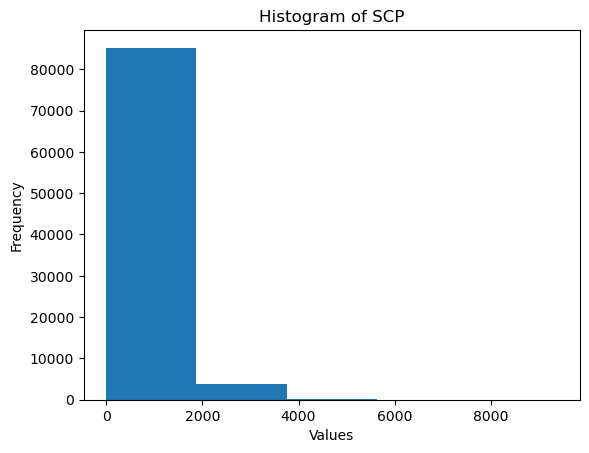

In [54]:
import matplotlib.pyplot as plt

plt.hist(new_df['mu_cape'], bins=5)  # Adjust the number of bins as needed
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram of SCP')
plt.show()


In [55]:
# Compute and print percentiles from 1st to 10th
for i in range(0, 11):
    percentile_value = new_df['mu_cape'].quantile(i / 10)  # Compute percentile value
    print(f"{i*10}th percentile value: {percentile_value}")

0th percentile value: 0.0
10th percentile value: 0.0
20th percentile value: 0.0
30th percentile value: 0.0625
40th percentile value: 14.9375
50th percentile value: 71.25
60th percentile value: 200.7249999999999
70th percentile value: 418.0625
80th percentile value: 757.625
90th percentile value: 1303.8375000000005
100th percentile value: 9376.625


In [58]:

for i in range(0, 6):
    percentile_value = new_df['bdsd'].quantile(i * 0.2)  # Compute the specific percentile
    print(f"{i*20}th percentile value: {percentile_value}")


0th percentile value: 0.0
20th percentile value: 0.0078125
40th percentile value: 0.0703125
60th percentile value: 0.2734375
80th percentile value: 0.65625
100th percentile value: 1.0


In [ ]:
import pandas as pd
import numpy as np

# Assuming your dataframe is named 'df'

# Step 1: Create an empty DataFrame to store probabilities
#percentile_ranges = [(0, 20), (20, 40), (40, 60), (60, 80), (80, 100)]
percentile_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60,70), (70,80), (80,90), (90,100)]

#percentile_ranges = [(70, 80), (80, 90), (90,100)]
probabilities_df = pd.DataFrame(index=new_df.columns, columns=range(len(percentile_ranges)))

# Step 2: Calculate probabilities for each variable across percentile ranges
for column in new_df.columns:  # Loop through each column in the DataFrame
    for i, (lower, upper) in enumerate(percentile_ranges):  # Loop through each percentile range
        # Calculate the percentile range for the current column
        if upper ==100:
            percentile_range = (new_df[column] >= np.percentile(new_df[column], lower)) & (new_df[column] <= np.percentile(new_df[column], upper))
        
        else:
            percentile_range = (new_df[column] >= np.percentile(new_df[column], lower)) & (new_df[column] < np.percentile(new_df[column], upper))

        
        # Calculate the probability where MaxHourlyGustInm_s is greater than or equal to 18 within that percentile range
        probability =  (percentile_range & (new_df['MaxHourlyGustInm_s'] >= 18)).sum() 
        
        # Store the probability in the corresponding cell of the probabilities DataFrame
        probabilities_df.loc[column, i] = probability

# Step 3: Calculate average probability across all columns

#probabilities_df['Cumulative_counts'] = probabilities_df.sum(axis=1)
#probabilities_df['Average'] = probabilities_df.mean(axis=1)

# Display the probabilities DataFrame
print('Counts or the number of instances where windspeed is greater than or equal to 18 m/s: ')
print(probabilities_df)


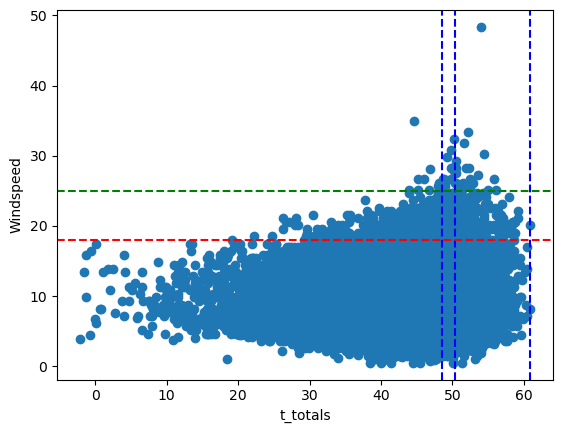

In [59]:
# Calculate the 8th, 9th, and 10th percentiles of 'scp'
percentiles = np.percentile(new_df['t_totals'], [80, 90, 100])

plt.scatter(new_df['t_totals'], new_df['MaxHourlyGustInm_s'])

# Add labels and title
plt.xlabel('t_totals')
plt.ylabel('Windspeed')
# Draw vertical lines at the 8th, 9th, and 10th percentiles
for percentile in percentiles:
    plt.axvline(x=percentile, color='blue', linestyle='--')  # Vertical line at the percentile, red dashed line

# Draw vertical lines at y = 18 and y = 25
plt.axhline(y=18, color='r', linestyle='--')  # Vertical line at y=18, red dashed line
plt.axhline(y=25, color='g', linestyle='--') 
# Show the plot
plt.show()

In [59]:
scp_df = new_df[new_df['bdsd']<=0.0079]
#scp_df 

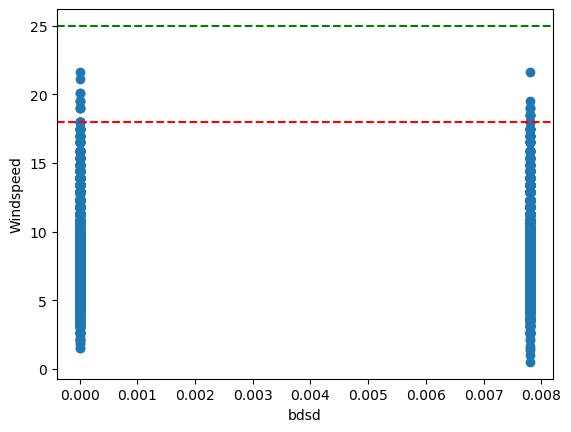

In [60]:
plt.scatter(scp_df['bdsd'], scp_df['MaxHourlyGustInm_s'])

# Add labels and title
plt.xlabel('bdsd')
plt.ylabel('Windspeed')
#plt.title('Scatter Plot of Two Rows')

# Draw vertical lines at y = 18 and y = 25
plt.axhline(y=18, color='r', linestyle='--')  # Vertical line at y=18, red dashed line
plt.axhline(y=25, color='g', linestyle='--') 
# Show the plot
plt.show()

### % of winds >= 18 m/s for zero and non-zero variable values

In [ ]:
# Iterate over each variable in the selected variables list
for variable in selected_variables:
    new_df.loc[:, variable] = (new_df[variable] != 0).astype(int)

new_df

In [59]:
import pandas as pd

# Assuming your DataFrame is named df with columns 'windspeed' and 'scp'

# Step 1: Filter for rows where scp is 0
scp_zero_df = new_df[new_df['scp'] == 0]

# Step 2: Count the occurrences where wind speed is >= 18 m/s within the scp 0 subset
high_wind_speed_count = scp_zero_df[scp_zero_df['MaxHourlyGustInm_s'] >= 18].shape[0]

# Step 3: Calculate the percentage
total_scp_zero = scp_zero_df.shape[0]
percentage_high_wind_scp_zero = (high_wind_speed_count / total_scp_zero) * 100 if total_scp_zero else 0

# Display the result
print(f"Percentage of wind speeds >= 18 m/s given scp is 0: {percentage_high_wind_scp_zero:.2f}%")


Percentage of wind speeds >= 18 m/s given scp is 0: 1.15%


In [60]:
import pandas as pd

# Assuming your DataFrame is named df with columns 'windspeed' and 'scp'

# Step 1: Filter for rows where scp is 0
scp_zero_df = new_df[new_df['scp'] == 1]

# Step 2: Count the occurrences where wind speed is >= 18 m/s within the scp 0 subset
high_wind_speed_count = scp_zero_df[scp_zero_df['MaxHourlyGustInm_s'] >= 18].shape[0]

# Step 3: Calculate the percentage
total_scp_zero = scp_zero_df.shape[0]
percentage_high_wind_scp_zero = (high_wind_speed_count / total_scp_zero) * 100 if total_scp_zero else 0

# Display the result
print(f"Percentage of wind speeds >= 18 m/s given scp is 1: {percentage_high_wind_scp_zero:.2f}%")


Percentage of wind speeds >= 18 m/s given scp is 1: 2.08%


In [63]:
import pandas as pd

# Assuming your DataFrame is named df with columns 'windspeed' and 'scp'

# Initialize dictionary to store results
results = {}

# Define a function to calculate the percentage for a given scp value
def calculate_percentage(new_df, scp_value):
    # Filter for rows where scp equals the specified value
    scp_df = new_df[new_df['scp'] == scp_value]
    
    # Count occurrences where wind speed is >= 18 m/s within the scp subset
    high_wind_speed_count = scp_df[scp_df['MaxHourlyGustInm_s'] >= 18].shape[0]
    
    # Calculate the percentage
    total_scp = scp_df.shape[0]
    percentage_high_wind_scp = (high_wind_speed_count / total_scp) * 100 if total_scp else 0
    
    return percentage_high_wind_scp

# Calculate percentages for scp values 0 and 1
results['scp=0'] = calculate_percentage(new_df, 0)
results['scp=1'] = calculate_percentage(new_df, 1)

# Print the results
print(f"Percentage of wind speeds >= 18 m/s given scp is 0: {results['scp=0']:.2f}%")
print(f"Percentage of wind speeds >= 18 m/s given scp is 1: {results['scp=1']:.2f}%")


Percentage of wind speeds >= 18 m/s given scp is 0: 1.15%
Percentage of wind speeds >= 18 m/s given scp is 1: 2.08%


In [67]:
import pandas as pd

# Assuming df is your DataFrame with 'windspeed' and the variables from selected_variables

# Define a function to calculate percentages for both 0 and 1 values of a given variable
def calculate_percentages(new_df, variable):
    percentages = {}
    # Iterate over binary values 0 and 1
    for value in [0, 1]:
        # Filter rows based on the current variable's binary value
        filtered_df = new_df[new_df[variable] == value]
        
        # Count where windspeed is >= 18 within this subset
        count_high_windspeed = filtered_df[filtered_df['MaxHourlyGustInm_s'] >= 18].shape[0]
        
        # Calculate percentage
        total_count = filtered_df.shape[0]
        percentage = (count_high_windspeed / total_count) * 100 if total_count else 0
        percentages[value] = percentage
    
    return percentages

# Initialize a list to store results for all variables
all_results = []

# Iterate over selected variables and compute percentages
for variable in selected_variables:
    percentages = calculate_percentages(new_df, variable)
    all_results.append([variable, percentages[0], percentages[1]])

# Convert the results list to a DataFrame
results_df = pd.DataFrame(all_results, columns=['Variable', 'Percentage when 0', 'Percentage when 1'])

# Display the DataFrame
print('Percentage of occurrences where windspeeds >= 18, for zero and non-zero variable values')
print(results_df)


Percentage of occurrences where windspeeds >= 18, for zero and non-zero variable values
        Variable  Percentage when 0  Percentage when 1
0        ml_cape           1.087761           1.485307
1        mu_cape           0.790544           1.471315
2       eff_cape           1.134055           1.427075
3           lr13           0.000000           1.268800
4        qmean01           0.000000           1.268800
5        rhmin03           0.000000           1.268800
6          ml_el           0.000000           1.268800
7       t_totals           0.000000           1.268800
8          dcape           0.000000           1.269525
9      q_melting           0.000000           1.268800
10    mlcape*s06           1.088734           1.481066
11          ebwd           1.134055           1.427075
12           s06           0.000000           1.268800
13  Umean800_600           0.000000           1.268800
14       Umean06           0.000000           1.268800
15          wg10           0.000

In [64]:
import pandas as pd

# Define a function to calculate the percentages for both 0 and 1 values of a given variable
def calculate_percentages(new_df, variable):
    results = {}
    for value in [0, 1]:
        # Filter for rows where the variable equals the current value
        var_df = new_df[new_df[variable] == value]
        
        # Count occurrences where wind speed is >= 18 m/s within the subset
        high_wind_speed_count = var_df[var_df['MaxHourlyGustInm_s'] >= 18].shape[0]
        
        # Calculate the percentage
        total_var_value = var_df.shape[0]
        percentage_high_wind = (high_wind_speed_count / total_var_value) * 100 if total_var_value else 0
        
        # Store the result
        results[f"{variable}={value}"] = percentage_high_wind
    
    return results

# Initialize an empty dictionary to store results for all variables
all_results = {}

# Iterate through each variable in selected_variables and calculate percentages
for variable in selected_variables:
    all_results.update(calculate_percentages(new_df, variable))

# Convert the results dictionary to a DataFrame
results_df = pd.DataFrame(list(all_results.items()), columns=['Variable=Value', 'Percentage of wind speeds >= 18 m/s'])

# Display the DataFrame
print(results_df)


    Variable=Value  Percentage of wind speeds >= 18 m/s
0        ml_cape=0                             1.087761
1        ml_cape=1                             1.485307
2        mu_cape=0                             0.790544
3        mu_cape=1                             1.471315
4       eff_cape=0                             1.134055
5       eff_cape=1                             1.427075
6           lr13=0                             0.000000
7           lr13=1                             1.268800
8        qmean01=0                             0.000000
9        qmean01=1                             1.268800
10       rhmin03=0                             0.000000
11       rhmin03=1                             1.268800
12         ml_el=0                             0.000000
13         ml_el=1                             1.268800
14      t_totals=0                             0.000000
15      t_totals=1                             1.268800
16         dcape=0                             0

### % of zero and non-zero SCP values having windspeed >= 18

In [50]:
new_df_18 = new_df[new_df['MaxHourlyGustInm_s']>=25]
new_df_18

,MaxHourlyGustInm_s,ml_cape,mu_cape,eff_cape,lr13,qmean01,rhmin03,ml_el,t_totals,dcape,...,wg10,dcp,scp,gustex,eff_sherb,k_index,bdsd,inverted_v,ta900,rh900
460,28.305556,43.8125,317.6250,317.6250,9.545898,7.082031,-15.052734,6789.5000,49.986328,1356.7500,...,10.125,0.367603,0.000000,46.449219,1.500802,33.895508,0.960938,31.283594,29.600006,-23.375000
1852,26.194444,0.0000,69.9375,0.0000,8.311523,5.039062,-23.000000,2791.6250,51.463867,833.9375,...,20.125,0.265794,0.000000,57.180664,0.000000,27.238281,0.789062,23.909092,19.225006,-31.249996
6359,31.888889,232.2500,788.0000,180.0000,9.059570,8.210938,-17.775391,8171.5625,51.615234,1262.1875,...,18.500,0.168788,0.000000,43.974609,0.280506,35.834961,0.859375,23.651434,27.475006,-30.625004
6376,26.194444,552.0000,991.1250,433.8750,8.372070,11.459961,-32.867188,10305.6250,48.987305,826.2500,...,22.125,1.493433,0.015621,57.283203,1.008646,39.998047,0.984375,11.579096,25.100006,-49.500008
7036,27.805556,0.0000,23.4375,0.0000,9.740234,5.008789,-9.876953,4308.0625,50.266602,1414.1250,...,21.625,0.056760,0.000000,49.760742,0.000000,26.707031,0.835938,40.137791,30.725006,-15.375000
7932,26.694444,1164.8125,1656.3125,812.0000,6.862305,13.851562,-57.625000,11918.1875,49.825195,556.1875,...,13.875,1.482591,1.250576,47.349609,0.877563,39.473633,0.984375,4.288513,20.975006,-76.249985
12850,25.694444,357.1875,455.9375,283.5625,9.197266,8.824219,-22.125000,10253.8125,52.377930,1219.0000,...,15.375,0.454101,0.000000,45.609375,0.765575,36.581055,0.976562,26.053549,28.850006,-30.374998
16595,25.194444,0.0000,82.5000,0.0000,3.798828,10.119141,-71.332031,670.2500,45.225586,49.1250,...,20.625,0.007058,0.000000,34.167969,0.000000,27.578125,0.039062,-19.726303,11.850006,-94.500008
17557,25.194444,46.2500,1236.6875,944.8125,7.355469,9.169922,-39.250000,6073.6875,48.326172,668.1875,...,15.125,0.520006,0.000000,29.784180,0.806032,30.806641,0.757812,13.075834,20.475006,-49.125000
18019,25.194444,119.6250,1011.0000,177.1250,8.839844,8.396484,-24.500000,7022.1875,54.996094,160.1875,...,16.125,0.449389,0.352343,52.287109,2.618634,32.641602,0.992188,30.589222,27.975006,-26.499996


In [51]:
# Iterate over each variable in the selected variables list
for variable in selected_variables:
    new_df_18.loc[:, variable] = (new_df_18[variable] != 0).astype(int)



NameError: name 'selected_variables' is not defined

In [ ]:
new_df_18

In [59]:
# Loop through each variable in selected variables
for variable in selected_variables:
    # Calculate value counts for the current variable
    value_counts = new_df_18[variable].value_counts()
    
    # Calculate percentages
    # Check if the key exists in value_counts to avoid KeyError
    percentage_0 = (value_counts.get(0, 0) / len(new_df_18)) * 100
    percentage_non_zeros = (value_counts.get(1, 0) / len(new_df_18)) * 100

    # Print the percentages
    print(f"Variable {variable}:")
    print(f"  Percentage of 0s: {percentage_0:.2f}%")
    print(f"  Percentage of non-zeros: {percentage_non_zeros:.2f}%")
    print()  # Blank line for better readability between variables


Variable ml_cape:
  Percentage of 0s: 46.69%
  Percentage of non-zeros: 53.31%

Variable mu_cape:
  Percentage of 0s: 18.53%
  Percentage of non-zeros: 81.47%

Variable eff_cape:
  Percentage of 0s: 48.28%
  Percentage of non-zeros: 51.72%

Variable lr13:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable qmean01:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable rhmin03:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable ml_el:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable t_totals:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable dcape:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable q_melting:
  Percentage of 0s: 0.00%
  Percentage of non-zeros: 100.00%

Variable mlcape*s06:
  Percentage of 0s: 46.43%
  Percentage of non-zeros: 53.57%

Variable ebwd:
  Percentage of 0s: 48.28%
  Percentage of non-zeros: 51.72%

Variable s06:
  Percentage of 0s: 0.00%
  P

In [60]:
import pandas as pd

# Initialize an empty dictionary to store the percentages
percentage_dict = {}

# Loop through each variable in selected variables
for variable in selected_variables:
    # Calculate value counts for the current variable
    value_counts = new_df_18[variable].value_counts()

    # Calculate percentages and store them in the dictionary
    percentage_0 = (value_counts.get(0, 0) / len(new_df_18)) * 100
    percentage_non_zeros = (value_counts.get(1, 0) / len(new_df_18)) * 100
    percentage_dict[variable] = {'Percentage of 0s': percentage_0, 'Percentage of non-zeros': percentage_non_zeros}

# Convert the dictionary to a DataFrame
percentage_df = pd.DataFrame(percentage_dict).T  # Transpose for better structure: variables as rows, percentages as columns

# Now, percentage_df contains the required information
print('Percentage of zero and non-zero variable values associated with windspeed >= 18 m/s')
print(percentage_df)


              Percentage of 0s  Percentage of non-zeros
ml_cape              46.690203                53.309797
mu_cape              18.534863                81.465137
eff_cape             48.278906                51.721094
lr13                  0.000000               100.000000
qmean01               0.000000               100.000000
rhmin03               0.000000               100.000000
ml_el                 0.000000               100.000000
t_totals              0.000000               100.000000
dcape                 0.000000               100.000000
q_melting             0.000000               100.000000
mlcape*s06           46.425419                53.574581
ebwd                 48.278906                51.721094
s06                   0.000000               100.000000
Umean800_600          0.000000               100.000000
Umean06               0.000000               100.000000
wg10                  0.000000               100.000000
dcp                  18.005296                81

In [125]:
# Define a function to apply your condition
def modify_column_value(x):
    if x == 0:
        return 0
    else:
        return 1

# Apply the function to the column
new_df_18.loc[:, 'scp'] = new_df_18['scp'].apply(lambda x: modify_column_value(x))
#new_df_18

In [126]:
# Calculate value counts
value_counts = new_df_18['scp'].value_counts()

# Calculate percentages
percentage_0 = (value_counts[0] / len(new_df_18)) * 100
percentage_non_zeros = (value_counts[1] / len(new_df_18)) * 100

# Print the percentages
print(f"Percentage of 0s: {percentage_0}%")
print(f"Percentage of non-zeros: {percentage_non_zeros}%")


Percentage of 0s: 79.2586054721977%
Percentage of non-zeros: 20.741394527802296%


### Number of events
 extreme  = 48, >=18 = 1133 

In [51]:
# import pandas as pd

# # Assuming df is your DataFrame
# dt_merged_df.to_csv('dt_csv.csv', index=False)  # Set index=False if you don't want to save the DataFrame index


In [52]:
xarray_df = new_df.to_xarray()

In [53]:
# import seaborn as sns
# new_df.pair_plot()

In [54]:
fixed_array = xarray_df.where(xarray_df.MaxHourlyGustInm_s >18, np.nan)

### Dropping variables from new_df

In [116]:
# Specify the column names to drop
columns_to_drop = ['ml_cape', 'eff_cape', 
                   'mlcape*s06',  'ebwd', 'scp', 'eff_sherb' ]

# Drop the columns
new_df = new_df.drop(columns=columns_to_drop)

In [119]:
new_df.describe([0.2,  0.4,  0.6,0.7, 0.8,0.9,  1]) 

,station_speed,mu_cape,lapserate1_3,qmean01,rhmin03,ml_el,t_totals,dcape,q_melting,s06,Umean800_600,Umean06,barra_wind,dcp,gustex,k_index,bdsd,inverted_v,ta900,rh900
count,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000,89297.000000
mean,8.703594,404.578552,6.521776,8.709416,-35.060188,4724.406738,43.436592,770.203552,2.764930,13.339765,8.590634,6.996531,10.730373,0.209931,32.181225,21.004044,0.300074,-6.437152,19.198927,-54.688030
std,3.223106,651.212646,1.884533,2.830045,19.875250,3402.781982,6.207071,438.589569,1.791385,7.438422,5.194229,4.475360,3.340559,0.664020,9.600841,12.370249,0.326567,21.756550,5.519416,24.464220
min,0.500000,0.000000,-0.667969,1.208008,-97.250000,386.375000,-2.219727,0.000000,0.008789,0.117188,0.039062,0.015625,1.250000,0.000000,0.424805,0.000000,0.000000,-86.826576,2.475006,-100.000038
20%,6.194444,0.000000,4.833984,6.101562,-52.833789,1714.387500,38.799805,367.937500,0.863281,6.804688,4.078125,3.195312,8.000000,0.000000,24.601562,6.554688,0.007812,-26.038477,14.100006,-80.999992
40%,7.694444,14.937500,6.089844,7.919922,-38.238867,2768.212500,42.893555,610.062500,1.906250,10.406250,6.414062,5.007812,9.750000,0.001704,29.751953,20.376367,0.070312,-9.701420,17.475006,-60.749993
50%,8.194444,71.250000,6.672852,8.715820,-31.823242,3356.437500,44.356445,731.187500,2.637695,12.234375,7.601562,5.984375,10.500000,0.009938,31.945312,24.603516,0.148438,-3.123188,19.100006,-51.750000
60%,9.305556,200.725000,7.229492,9.522461,-26.325391,4389.912500,45.720703,860.125000,3.354492,14.210938,8.945312,7.148438,11.375000,0.030611,34.247656,27.699219,0.273438,2.047940,20.725006,-44.249996
70%,9.805556,418.062500,7.747070,10.334961,-21.398242,6435.437500,47.053711,1003.312500,4.000000,16.445312,10.546875,8.531250,12.250000,0.077203,36.801758,30.176758,0.445312,6.297762,22.350006,-37.374992
80%,10.805556,757.625000,8.298828,11.242188,-16.766016,8369.350000,48.496875,1164.875000,4.616211,19.265625,12.710938,10.406250,13.250000,0.185892,39.881836,32.380859,0.656250,11.736470,24.225006,-30.625000


### Number of instances where windspeed >= 18m/s in each quantile

In [54]:
import pandas as pd
import numpy as np

# Assuming your dataframe is named 'df'

# Step 1: Create an empty DataFrame to store probabilities
percentile_ranges = [(0, 20), (20, 40), (40, 60), (60, 80), (80, 100)]
#percentile_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60,70), (70,80), (80,90), (90,100)]

#percentile_ranges = [(70, 80), (80, 90), (90,100)]
probabilities_df = pd.DataFrame(index=new_df.columns, columns=range(len(percentile_ranges)))

# Step 2: Calculate probabilities for each variable across percentile ranges
for column in new_df.columns:  # Loop through each column in the DataFrame
    for i, (lower, upper) in enumerate(percentile_ranges):  # Loop through each percentile range
        # Calculate the percentile range for the current column
        if upper ==100:
            percentile_range = (new_df[column] >= np.percentile(new_df[column], lower)) & (new_df[column] <= np.percentile(new_df[column], upper))
        
        else:
            percentile_range = (new_df[column] >= np.percentile(new_df[column], lower)) & (new_df[column] < np.percentile(new_df[column], upper))

        
        # Calculate the probability where MaxHourlyGustInm_s is greater than or equal to 18 within that percentile range
        probability =  (percentile_range & (new_df['station_speed'] >= 25)).sum() 
        
        # Store the probability in the corresponding cell of the probabilities DataFrame
        probabilities_df.loc[column, i] = probability

# Step 3: Calculate average probability across all columns

probabilities_df['Cumulative_counts'] = probabilities_df.sum(axis=1)
#probabilities_df['Average'] = probabilities_df.mean(axis=1)

# Display the probabilities DataFrame
print('Counts or the number of instances where windspeed is greater than or equal to 25 m/s: ')
print(probabilities_df)


Counts or the number of instances where windspeed is greater than or equal to 25 m/s: 
                0   1   2   3   4 Cumulative_counts
station_speed   0   0   0   0  48                48
mu_cape         0   0   6  14  28                48
lapserate1_3    1   2   5  19  21                48
qmean01         6   6  11  12  13                48
rhmin03         4  15  16  10   3                48
ml_el           1   2   4  17  24                48
t_totals        0   0   4   6  38                48
dcape          10   6  11   8  13                48
q_melting       0   2   4  18  24                48
s06             3   3   9  14  19                48
Umean800_600    1   2   7   9  29                48
Umean06         1   2   5  10  30                48
barra_wind      5   3   1   7  32                48
dcp             0   0   4  11  33                48
gustex          5   3   4  10  26                48
k_index         0   1   7  13  27                48
bdsd            0   1   2   5

### Editing the number of counts for mucape and dcp for windspeeds >= 18

In [56]:
# Editing the second row/ mucape entirely
probabilities_df.iloc[1] = [ 140, 181,  281,  246,   285, 1133  ]
probabilities_df.iloc[13] = [ 136, 146,  190,  222,   439, 1133  ]

probabilities_df

,0,1,2,3,4,Cumulative_counts
station_speed,0,0,0,0,1133,1133
mu_cape,140,181,281,246,285,1133
lapserate1_3,113,126,196,270,428,1133
qmean01,347,211,172,194,209,1133
rhmin03,217,173,295,234,214,1133
ml_el,166,196,215,287,269,1133
t_totals,98,143,196,245,451,1133
dcape,302,184,219,224,204,1133
q_melting,72,111,256,377,317,1133
s06,84,119,178,228,524,1133


### Editing the number of counts for q_melting and bdsd for windspeeds >= 25

In [55]:
# Editing the rows entirely - q_melting, bdsd

probabilities_df.iloc[8] = [ 0,   2,   4,  18,  24, 48]
probabilities_df.iloc[16] = [0 ,  1,   2 ,  5,  40, 48]

probabilities_df

,0,1,2,3,4,Cumulative_counts
station_speed,0,0,0,0,48,48
mu_cape,0,0,6,14,28,48
lapserate1_3,1,2,5,19,21,48
qmean01,6,6,11,12,13,48
rhmin03,4,15,16,10,3,48
ml_el,1,2,4,17,24,48
t_totals,0,0,4,6,38,48
dcape,10,6,11,8,13,48
q_melting,0,2,4,18,24,48
s06,3,3,9,14,19,48


In [56]:
import pandas as pd
import numpy as np

# Assuming your dataframe is named 'df'

# Step 1: Create an empty DataFrame to store probabilities
percentile_ranges = [(0, 20), (20, 40), (40, 60), (60, 80), (80, 100)]
#percentile_ranges = [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), (60,70), (70,80), (80,90), (90,100)]

#percentile_ranges = [(70, 80), (80, 90), (90,100)]
probabilities_df = pd.DataFrame(index=new_df.columns, columns=range(len(percentile_ranges)))

# Step 2: Calculate probabilities for each variable across percentile ranges
for column in new_df.columns:  # Loop through each column in the DataFrame
    for i, (lower, upper) in enumerate(percentile_ranges):  # Loop through each percentile range
        # Calculate the percentile range for the current column
        if upper ==100:
            percentile_range = (new_df[column] >= np.percentile(new_df[column], lower)) & (new_df[column] <= np.percentile(new_df[column], upper))
        
        else:
            percentile_range = (new_df[column] >= np.percentile(new_df[column], lower)) & (new_df[column] < np.percentile(new_df[column], upper))

        
        # Calculate the probability where MaxHourlyGustInm_s is greater than or equal to 18 within that percentile range
        probability =  (percentile_range & (new_df['station_speed'] >= 25)).sum() / 17893
        
        # Store the probability in the corresponding cell of the probabilities DataFrame
        probabilities_df.loc[column, i] = probability

# Step 3: Calculate average probability across all columns

#probabilities_df['Cumulative_counts'] = probabilities_df.sum(axis=1)
probabilities_df['Average'] = probabilities_df.mean(axis=1)

# Display the probabilities DataFrame
print(probabilities_df)
print(percentile_range.sum())

                      0         1         2         3         4   Average
station_speed       0.0       0.0       0.0       0.0  0.002683  0.000537
mu_cape             0.0       0.0  0.000335  0.000782  0.001565  0.000537
lapserate1_3   0.000056  0.000112  0.000279  0.001062  0.001174  0.000537
qmean01        0.000335  0.000335  0.000615  0.000671  0.000727  0.000537
rhmin03        0.000224  0.000838  0.000894  0.000559  0.000168  0.000537
ml_el          0.000056  0.000112  0.000224   0.00095  0.001341  0.000537
t_totals            0.0       0.0  0.000224  0.000335  0.002124  0.000537
dcape          0.000559  0.000335  0.000615  0.000447  0.000727  0.000537
q_melting           0.0  0.000112  0.000224  0.001006  0.001341  0.000537
s06            0.000168  0.000168  0.000503  0.000782  0.001062  0.000537
Umean800_600   0.000056  0.000112  0.000391  0.000503  0.001621  0.000537
Umean06        0.000056  0.000112  0.000279  0.000559  0.001677  0.000537
barra_wind     0.000279  0.000168  0.0

### Editing the probability of mucape and dcape for windspeeds >= 18

In [58]:
# Editing the second row/ mucape entirely
probabilities_df.iloc[1] = [ 0.00782,  0.01011,  0.015704,  0.013748,  0.015928,  0.012664 ]

probabilities_df.iloc[13] = [ 0.00760,  0.00815,  0.010619,  0.012407,  0.024535,  0.012664  ]

probabilities_df

,0,1,2,3,4,Average
station_speed,0.0,0.0,0.0,0.0,0.063321,0.012664
mu_cape,0.00782,0.01011,0.015704,0.013748,0.015928,0.012664
lapserate1_3,0.006315,0.007042,0.010954,0.01509,0.02392,0.012664
qmean01,0.019393,0.011792,0.009613,0.010842,0.011681,0.012664
rhmin03,0.012128,0.009669,0.016487,0.013078,0.01196,0.012664
ml_el,0.009277,0.010954,0.012016,0.01604,0.015034,0.012664
t_totals,0.005477,0.007992,0.010954,0.013693,0.025205,0.012664
dcape,0.016878,0.010283,0.012239,0.012519,0.011401,0.012664
q_melting,0.004024,0.006204,0.014307,0.02107,0.017716,0.012664
s06,0.004695,0.006651,0.009948,0.012742,0.029285,0.012664


In [54]:
percentile_range.sum()

17893

In [57]:
## Odds ratio calculation

# Select the first 5 columns of the DataFrame
selected_columns = probabilities_df.iloc[:, :5]

# Perform element-wise division by 0.065325
probabilities_df_or = selected_columns.divide(0.000537)

# Return the result as a DataFrame
probabilities_df_or


,0,1,2,3,4
station_speed,0.0,0.0,0.0,0.0,4.995556
mu_cape,0.0,0.0,0.624444,1.457037,2.914074
lapserate1_3,0.104074,0.208148,0.52037,1.977407,2.185556
qmean01,0.624444,0.624444,1.144815,1.248889,1.352963
rhmin03,0.416296,1.561111,1.665185,1.040741,0.312222
ml_el,0.104074,0.208148,0.416296,1.769259,2.497778
t_totals,0.0,0.0,0.416296,0.624444,3.954815
dcape,1.040741,0.624444,1.144815,0.832593,1.352963
q_melting,0.0,0.208148,0.416296,1.873333,2.497778
s06,0.312222,0.312222,0.936667,1.457037,1.977407


In [58]:
probabilities_df_or = probabilities_df_or.apply(pd.to_numeric, errors='coerce')
probabilities_df_or

,0,1,2,3,4
station_speed,0.000000,0.000000,0.000000,0.000000,4.995556
mu_cape,0.000000,0.000000,0.624444,1.457037,2.914074
lapserate1_3,0.104074,0.208148,0.520370,1.977407,2.185556
qmean01,0.624444,0.624444,1.144815,1.248889,1.352963
rhmin03,0.416296,1.561111,1.665185,1.040741,0.312222
ml_el,0.104074,0.208148,0.416296,1.769259,2.497778
t_totals,0.000000,0.000000,0.416296,0.624444,3.954815
dcape,1.040741,0.624444,1.144815,0.832593,1.352963
q_melting,0.000000,0.208148,0.416296,1.873333,2.497778
s06,0.312222,0.312222,0.936667,1.457037,1.977407


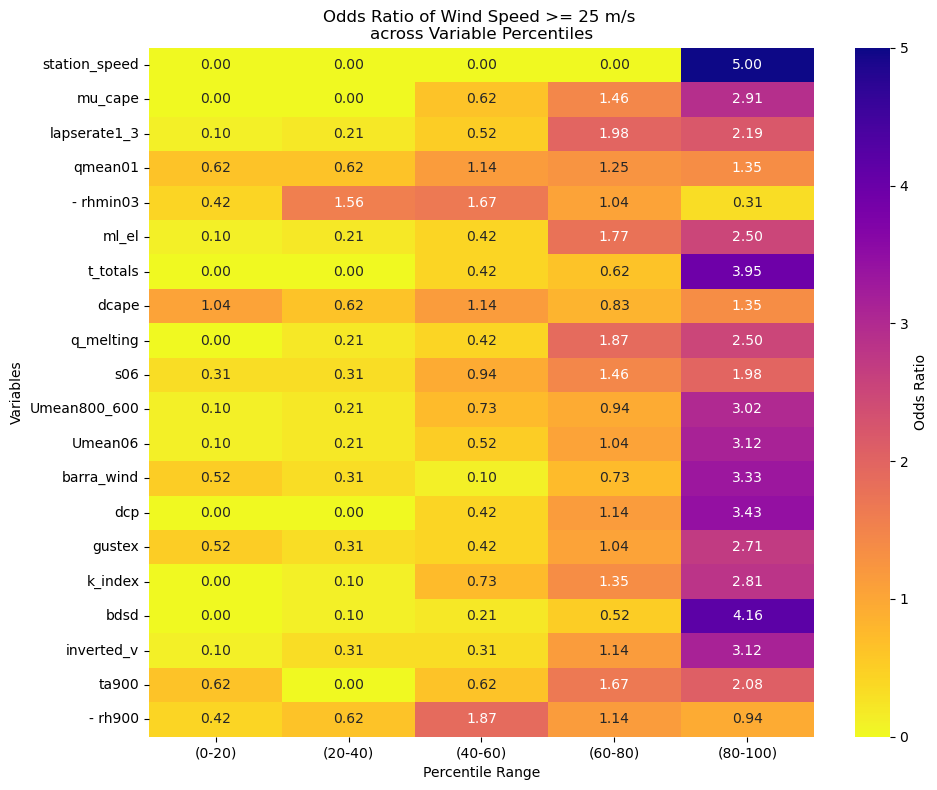

In [59]:
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['station_speed','mu_cape',  'lapserate1_3', 
                  'qmean01', '- rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting',  's06',  'Umean800_600', 
                  'Umean06', 'barra_wind', 'dcp',  'gustex','k_index', 
                  'bdsd', 'inverted_v', 'ta900','- rh900' ]

percentiles = ['(0-20)', '(20-40)', '(40-60)', '(60-80)', '(80-100)']

probabilities_data = probabilities_df_or
# Plot heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(probabilities_data, cmap='plasma_r', annot=True, fmt=".2f", cbar=True,
                      cbar_kws={'label': 'Odds Ratio'
                               })
# Set custom ticks for the colorbar
cbar = heatmap.collections[0].colorbar
cbar.set_ticks([0, 1, 2, 3, 4, 5])

# Customize x-axis and y-axis ticks
heatmap.set_xticklabels(percentiles)
heatmap.set_yticklabels(variables)

plt.xlabel('Percentile Range')
plt.ylabel('Variables')
plt.title('Odds Ratio of Wind Speed >= 25 m/s \nacross Variable Percentiles')
plt.tight_layout()
plt.show()


In [60]:
##Percentage of chance calculation

# Perform element-wise division by 0.065325
probabilities_df_pc = selected_columns.multiply(100)

# Return the result as a DataFrame
probabilities_df_pc

,0,1,2,3,4
station_speed,0.0,0.0,0.0,0.0,0.268261
mu_cape,0.0,0.0,0.033533,0.078243,0.156486
lapserate1_3,0.005589,0.011178,0.027944,0.106187,0.117364
qmean01,0.033533,0.033533,0.061477,0.067065,0.072654
rhmin03,0.022355,0.083832,0.08942,0.055888,0.016766
ml_el,0.005589,0.011178,0.022355,0.095009,0.134131
t_totals,0.0,0.0,0.022355,0.033533,0.212374
dcape,0.055888,0.033533,0.061477,0.04471,0.072654
q_melting,0.0,0.011178,0.022355,0.100598,0.134131
s06,0.016766,0.016766,0.050299,0.078243,0.106187


In [61]:
probabilities_df_pc = probabilities_df_pc.apply(pd.to_numeric, errors='coerce')
probabilities_df_pc

,0,1,2,3,4
station_speed,0.000000,0.000000,0.000000,0.000000,0.268261
mu_cape,0.000000,0.000000,0.033533,0.078243,0.156486
lapserate1_3,0.005589,0.011178,0.027944,0.106187,0.117364
qmean01,0.033533,0.033533,0.061477,0.067065,0.072654
rhmin03,0.022355,0.083832,0.089420,0.055888,0.016766
ml_el,0.005589,0.011178,0.022355,0.095009,0.134131
t_totals,0.000000,0.000000,0.022355,0.033533,0.212374
dcape,0.055888,0.033533,0.061477,0.044710,0.072654
q_melting,0.000000,0.011178,0.022355,0.100598,0.134131
s06,0.016766,0.016766,0.050299,0.078243,0.106187


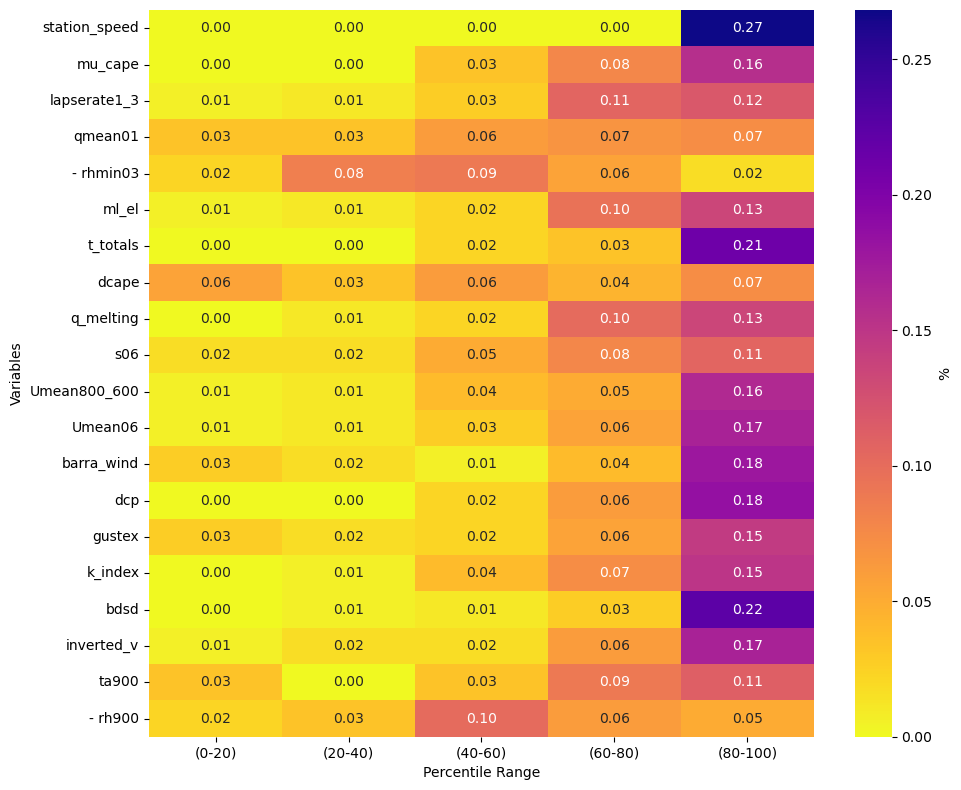

In [62]:
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['station_speed','mu_cape', 'lapserate1_3', 
                  'qmean01', '- rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting',  's06',  'Umean800_600', 
                  'Umean06', 'barra_wind', 'dcp',  'gustex', 'k_index', 
                  'bdsd', 'inverted_v', 'ta900','- rh900' ]

percentiles = ['(0-20)', '(20-40)', '(40-60)', '(60-80)', '(80-100)']


# Plot heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(probabilities_df_pc, cmap='plasma_r', annot=True, fmt=".2f", cbar=True,
                      cbar_kws={'label': '%'})
# Set custom ticks for the colorbar
cbar = heatmap.collections[0].colorbar
#cbar.set_ticks([0, 1, 2, 3, 4, 5, 6])

# Customize x-axis and y-axis ticks
heatmap.set_xticklabels(percentiles)
heatmap.set_yticklabels(variables)

plt.xlabel('Percentile Range')
plt.ylabel('Variables')
#plt.title('Percentage of Wind Speed >= 25 m/s \nacross Variable Percentiles')
plt.tight_layout()
plt.show()


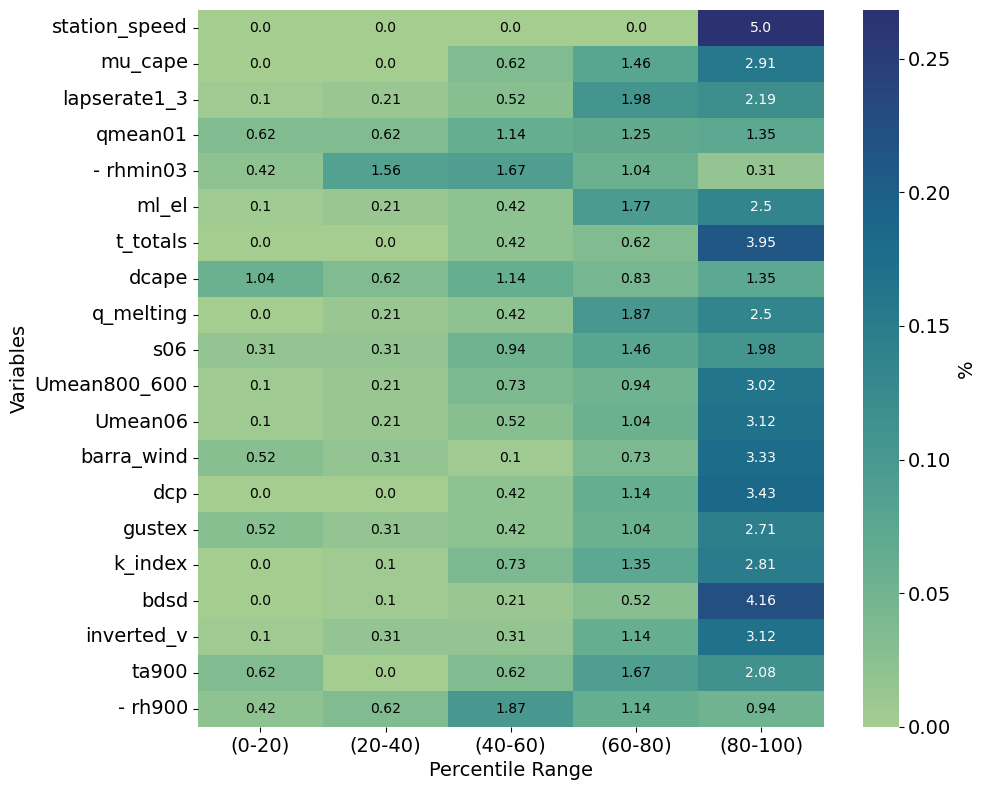

In [63]:
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['station_speed','mu_cape', 'lapserate1_3', 
                  'qmean01', '- rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting',  's06',  'Umean800_600', 
                  'Umean06', 'barra_wind', 'dcp',  'gustex', 'k_index', 
                  'bdsd', 'inverted_v', 'ta900','- rh900' ]

percentiles = ['(0-20)', '(20-40)', '(40-60)', '(60-80)', '(80-100)']


# Plot heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(probabilities_df_pc, cmap='crest', annot=False, fmt=".2f", cbar=True,
                      cbar_kws={'label': '%'})

# Customize font size of the x-axis and y-axis ticks
plt.xticks(fontsize=14)  # Increase x-tick font size
plt.yticks(fontsize=14)  # Increase y-tick font size
# Set custom ticks for the colorbar
cbar = heatmap.collections[0].colorbar
#cbar.set_ticks([0, 1, 2, 3, 4, 5, 6])
cbar.ax.tick_params(labelsize=14)  # Increase colorbar tick font size
cbar.set_label('%', fontsize=14)  # Increase colorbar label font size

# Customize x-axis and y-axis ticks
heatmap.set_xticklabels(percentiles)
heatmap.set_yticklabels(variables)

# Annotate heatmap with rounded values from odds ratio df
for i in range(len(variables)):
    for j in range(len(percentiles)):
        rounded_value = round(probabilities_df_or.iloc[i, j], 2)  # Round the value to 2 decimal places
        color = 'black' if rounded_value < 2 else 'white'
        plt.text(j + 0.5, i + 0.5, str(rounded_value), ha='center', va='center', color=color)

plt.xlabel('Percentile Range', fontsize=14)
plt.ylabel('Variables', fontsize=14)
#plt.title('Percentage of Wind Speed >= 25 m/s \nacross Variable Percentiles')
plt.tight_layout()
plt.show()


## Decision tree classifier

In [54]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation


from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score


In [55]:
# Define a function to apply your condition
def modify_column_value(x):
    if x >= 18:
        return 1
    else:
        return 0

# Apply the function to the column
new_df['MaxHourlyGustInm_s'] = new_df['MaxHourlyGustInm_s'].apply(lambda x: modify_column_value(x))

In [56]:
# file_path = "/g/data/up6/gs5098/BARRA_indices_time_series/new_df.csv"

# # Save the DataFrame to a CSV file
# new_df.to_csv(file_path, index=False)  # Set index=False if you don't want to write row indices


In [57]:
new_df = pd.read_csv("/g/data/up6/gs5098/BARRA_indices_time_series/new_df.csv")

In [77]:
new_df[new_df['MaxHourlyGustInm_s']==1]

,MaxHourlyGustInm_s,ml_cape,mu_cape,eff_cape,lr13,qmean01,rhmin03,ml_el,t_totals,dcape,...,wg10,dcp,scp,gustex,eff_sherb,k_index,bdsd,inverted_v,ta900,rh900
319,1,703.5625,2136.8750,523.7500,8.415039,12.226562,-35.375000,11548.5000,47.941406,1110.6250,...,7.625,1.873355,0.971312,48.483400,0.938203,38.466797,0.945312,11.592739,27.100006,-45.500000
460,1,43.8125,317.6250,317.6250,9.545898,7.082031,-15.052734,6789.5000,49.986330,1356.7500,...,10.125,0.367603,0.000000,46.449220,1.500802,33.895508,0.960938,31.283594,29.600006,-23.375000
752,1,0.0000,0.0000,0.0000,6.700195,6.476562,-31.670898,2163.1875,42.034180,272.8750,...,11.500,0.000000,0.000000,49.722656,0.000000,29.743164,0.609375,17.412134,17.475006,-45.499992
782,1,0.0000,0.0000,0.0000,6.320312,4.308594,-26.792969,2052.3125,42.531250,534.3750,...,16.250,0.000000,0.000000,47.107420,0.000000,8.783203,0.132812,-11.834655,10.725006,-47.375004
1018,1,13.0000,93.8125,0.0000,9.497070,7.030273,-19.968750,6031.2500,49.681640,1093.3750,...,12.250,0.138582,0.000000,48.375977,0.000000,34.120117,0.796875,28.609930,26.850006,-27.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88581,1,0.0000,416.1250,416.1250,9.025391,7.130859,-24.288086,2866.4375,45.885742,1261.1250,...,15.875,1.596089,0.000000,55.987305,1.743999,32.342773,0.992188,5.982584,22.975006,-34.375004
88728,1,2197.5625,3888.3750,1369.1875,7.175781,16.040040,-43.500000,12374.9375,52.912110,1090.2500,...,9.875,15.826150,21.968739,51.199220,1.628662,36.783203,1.000000,13.405159,27.100006,-49.374996
89071,1,30.1875,444.3125,444.3125,9.230469,9.317383,-21.531250,9823.6875,44.149414,1003.7500,...,10.000,0.170311,0.000000,42.487305,0.769232,34.260742,0.843750,16.833470,28.975006,-31.250000
89136,1,1079.7500,1897.8125,1079.7500,6.298828,13.793945,-72.750000,10808.6250,45.736330,219.0000,...,5.500,0.313428,0.972352,34.778320,0.782446,36.068360,0.859375,4.433323,17.975006,-72.749990


In [59]:
#split dataset in features and target variable
feature_cols = ['ml_cape', 'mu_cape', 'eff_cape', 'lr13', 
                  'qmean01', 'rhmin03',  'ml_el', 't_totals',  
                  'dcape', 'q_melting', 'mlcape*s06',  'ebwd',  's06',  'Umean800_600', 
                  'Umean06', 'wg10', 'dcp', 'scp',   'gustex', 'eff_sherb', 'k_index', 
                  'bdsd', 'inverted_v', 'ta900','rh900']
target_cols = ['MaxHourlyGustInm_s']

X = new_df[feature_cols] # Features
y = new_df[target_cols] # Target variable


In [60]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test


In [61]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)


In [62]:
# Model Accuracy, how often is the classifier correct?
#Accuracy is a commonly used metric for evaluating the performance of a machine learning model. 
#It measures the proportion of correct predictions made by the model on a given dataset.
#In a binary classification problem, accuracy is defined as the number of correct predictions divided by the total number of predictions. 

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.9804031354983203


In [63]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())


In [64]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.9878312803284808


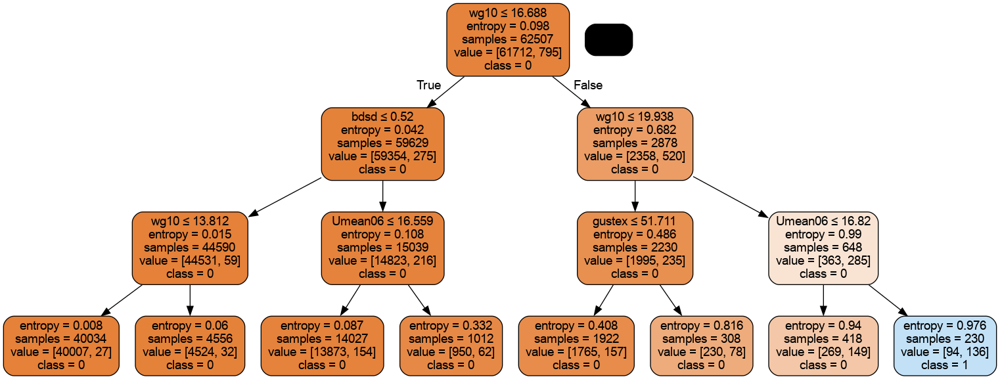

In [65]:
from six import StringIO 
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())

In [66]:
# Classification report
print(f'Classification Report: \n{classification_report(y_test, y_pred)}')

Classification Report: 
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     26452
           1       0.55      0.20      0.29       338

    accuracy                           0.99     26790
   macro avg       0.77      0.60      0.64     26790
weighted avg       0.98      0.99      0.98     26790



<Axes: >

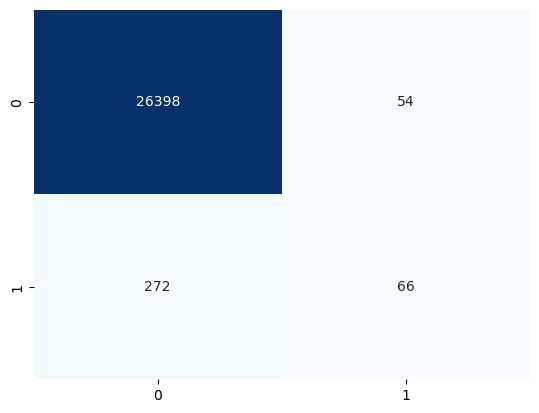

In [67]:
import seaborn as sns

# Confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

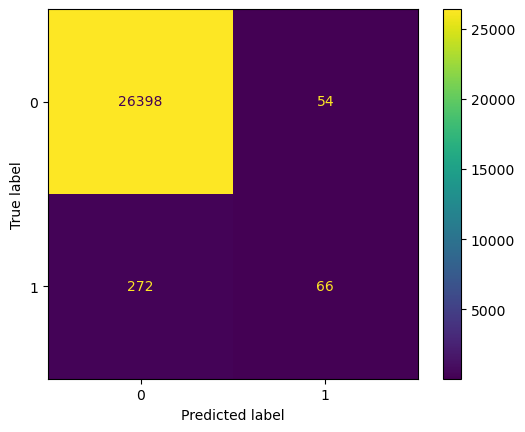

In [73]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_pred = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

# Plot the confusion matrix
disp.plot()

# plotting graphs for stations

# Indicators of environmental instability
## Thermodynamic indices, Energy indices..

In [74]:
import pandas as pd

# List of diagnostics columns to merge
diagnostics_td = ['mu_cape',  'dcape', 
               'ta900',   'lr13', 't_totals', 'k_index', 'inverted_v',
                 'ml_el',  'dcp', 'bdsd' ]


# List of DataFrames
dataframes_all = [new_frame_wa_nad, new_frame_sy_nad, new_frame_ri_nad, 
              new_frame_bd_nad,new_frame_tm_nad, new_frame_mo_nad]  # Add your DataFrames here

dataframes_strong = [wa_strong_nad, sy_strong_nad, ri_strong_nad, 
              bd_strong_nad,tm_strong_nad, mo_strong_nad]

dataframes_extreme = [wa_extreme_nad, sy_extreme_nad, ri_extreme_nad, 
              bd_extreme_nad,tm_extreme_nad, mo_extreme_nad]

# Merge columns for each diagnostic
merged_diagnostics_all = {}
for diagnostic in diagnostics_td:
    merged_column_all = pd.concat([df[diagnostic] for df in dataframes_all], axis=0, ignore_index=True)
    merged_diagnostics_all[diagnostic] = merged_column_all

merged_diagnostics_strong = {}
for diagnostic in diagnostics_td:
    merged_column_strong = pd.concat([df[diagnostic] for df in dataframes_strong], axis=0, ignore_index=True)
    merged_diagnostics_strong[diagnostic] = merged_column_strong

merged_diagnostics_extreme = {}
for diagnostic in diagnostics_td:
    merged_column_extreme = pd.concat([df[diagnostic] for df in dataframes_extreme], axis=0, ignore_index=True)
    merged_diagnostics_extreme[diagnostic] = merged_column_extreme

# Create a new DataFrame with merged columns for all diagnostics
merged_df_all_td = pd.DataFrame(merged_diagnostics_all)
merged_df_strong_td = pd.DataFrame(merged_diagnostics_strong)
merged_df_extreme_td = pd.DataFrame(merged_diagnostics_extreme)

In [75]:
import numpy as np

# List of variables
variables_td =  ['mu_cape',  'dcape', 
               'ta900',   'lr13', 't_totals', 'k_index', 'inverted_v',
                 'ml_el',  'dcp', 'bdsd' ]

# Initialize an empty dictionary to store arrays of values for each variable
values_dict_bd = {}
values_dict_ri = {}
values_dict_tm = {}
values_dict_sy = {}
values_dict_mo = {}
values_dict_wa = {}

# Loop through each variable
for variable in variables_td:
    # Initialize an empty list to store values for the current variable
    variable_values_bd = []
    variable_values_ri = []
    variable_values_tm = []
    variable_values_mo = []
    variable_values_wa = []
    variable_values_sy = []
    # Append values for each variable to the list
    variable_values_bd.append(df_bd[df_bd['time'] == '2016-01-28T05:00:00'][variable].values)
    variable_values_sy.append(df_ri[df_ri['time'] == '2001-12-03T02:00:00'][variable].values)
    variable_values_mo.append(df_sy[df_sy['time'] == '2016-01-14T04:00:00'][variable].values)
    variable_values_ri.append(df_mo[df_mo['time'] == '2015-12-16T08:00:00'][variable].values)
    variable_values_tm.append(df_tm[df_tm['time'] == '2017-02-17T07:00:00'][variable].values)
    variable_values_wa.append(df_wa[df_wa['time'] == '2009-01-20T05:00:00'][variable].values)
    # Store the list of values for the current variable in the dictionary
    values_dict_bd[variable] = variable_values_bd
    values_dict_ri[variable] = variable_values_ri
    values_dict_sy[variable] = variable_values_sy
    values_dict_tm[variable] = variable_values_tm
    values_dict_wa[variable] = variable_values_wa
    values_dict_mo[variable] = variable_values_mo

In [76]:
## Values at x=0 for blobs

ri_td_0 = np.array([2065.5, 1184.1875, 27.600006, 8.6953125, 54.043945, 
                    30.873047, 23.36089, 11225.8125, 5.325174, 1.0])
sy_td_0 = np.array([3548.375, 779.6875, 28.225006, 8.873047, 52.180664, 
                    43.838867, 19.253288, 13358.0625, 3.217396, 1.0])
mo_td_0 = np.array([280.625, 976.125, 23.975006, 9.374023, 50.20117,
                    36.29297, 25.695118, 9321.0, 0.08293709, 0.921875])
bd_td_0 = np.array([1230.125, 861.0625, 19.975006, 6.451172, 46.908203, 
                    23.189453, -20.618708, 8786.75, 0.6173986, 0.4375])
wa_td_0 = np.array([788.0, 1262.1875, 27.475006, 9.05957, 51.615234, 35.83496, 
                    23.651434, 8171.5625, 0.16878782, 0.859375])
tm_td_0 = np.array([2241.5, 859.0, 25.350006, 7.8164062, 48.086914, 
                    30.375977, 14.180969, 9314.4375, 1.9654429, 0.8515625])


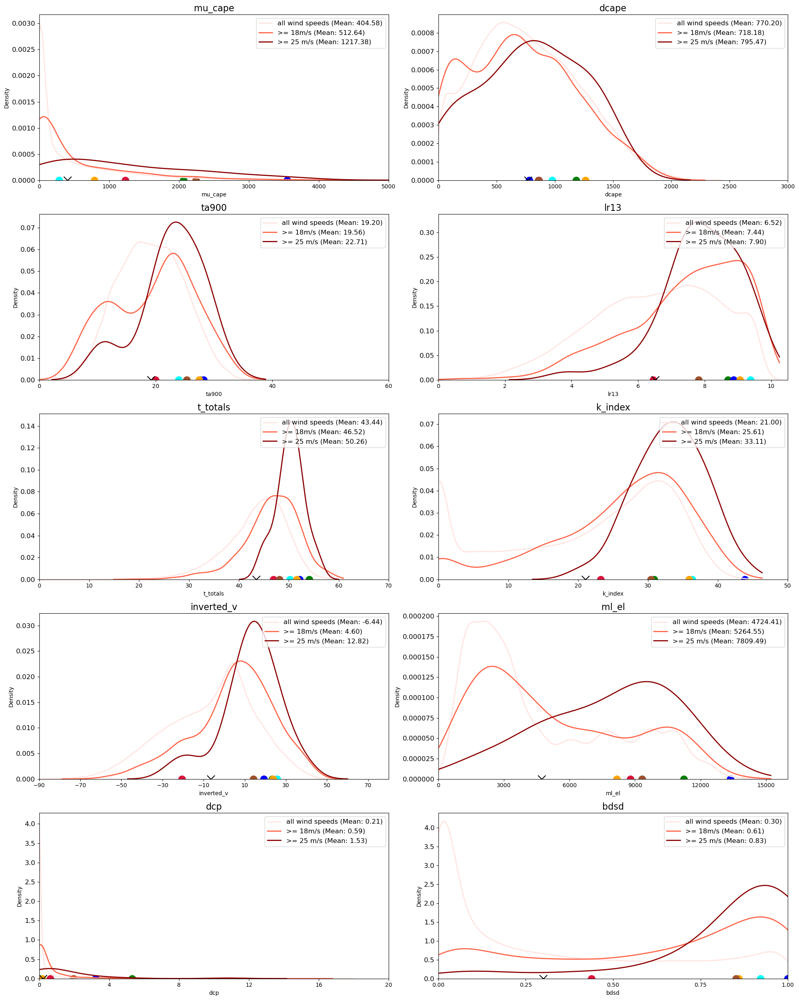

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings


# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables_td = merged_df_all_td.columns  # Assuming columns represent variables

num_vars = len(variables_td)
num_cols = 2
num_rows = (num_vars + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

custom_x_limits = {
     'mu_cape': (0, 5000),
   'lr13': (0, 10.5), 
    'ml_el': (0, 16000), 
    't_totals': (0, 70), 'dcape': (0, 3000), 
     'dcp': (0, 20),   'k_index': (0, 50),'bdsd': (0, 1),
    'inverted_v': (-90, 80),  'ta900': (0, 60)
    # Add more variables as needed
}

custom_x_ticks = { 'mu_cape': np.arange(0, 5001, 1000),
    'lr13': np.arange(0, 10.6, 2), 
    'ml_el': np.arange(0, 16005, 3000),
     't_totals': np.arange(0, 71, 10),
     'dcape': np.arange(0, 3001, 500),
     
    'dcp': np.arange(0, 21, 4),
    'k_index': np.arange(0, 51, 10),  'bdsd': np.arange(0, 1.15, 0.25),
    'inverted_v': np.arange(-90, 81, 20),  'ta900': np.arange(0, 61, 20)
    # Add more variables as needed
}

for i, variable in enumerate(variables_td):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col]

    max_value = max(merged_df_all_td[variable].max(), merged_df_strong_td[variable].max(), merged_df_extreme_td[variable].max())
    # Adjust xlims and xticks based on the variable
    ax.set_xlim(custom_x_limits[variable])
    ax.set_xticks(custom_x_ticks[variable])

    clip_range = (0, max_value)  # Default clip range

    if variable == 'inverted_v':
        clip_range = (-90, max_value)
    # elif variable == 'sherb':
    #     clip_range = (0, 3.5)
    
    means = []  # Empty list to store means for each dataset
    labels = []  # Empty list to store labels for legend
    
    for dataset, color, labell in zip([merged_df_all_td[variable], merged_df_strong_td[variable], merged_df_extreme_td[variable]], 
                                     ['mistyrose', 'tomato', 'darkred'], 
                                     ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
        mean = np.mean(dataset)
        
        means.append(mean)
        labels.append(f'{labell} (Mean: {"%.2f" % mean})')

        sns.kdeplot(data=dataset, color=color, ax=ax, lw=2, clip=clip_range)

    # Add scatter points for arrays a, b, and c
    for j, array in enumerate([ri_td_0, sy_td_0, mo_td_0, bd_td_0, wa_td_0, tm_td_0]):
        if i < len(array):  # Check if the array has enough elements for this subplot
            ax.scatter(array[i], 0, color=['green', 'blue', 'cyan', 'crimson', 'orange', 'sienna'][j], s=160)

    # Add a cross mark to indicate the mean of "all wind speeds"
    ax.scatter(np.mean(merged_df_all_td[variable]), 0, marker='x', color='black', s=190)
    
    ax.set_title(variable, fontsize=16)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(labels, loc='upper right', fontsize=12)

# Hide empty subplots
for i in range(num_vars, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()


## printing mean values for all speeds

In [78]:
import numpy as np
import pandas as pd

# Your existing code for plotting KDEs and calculating means
# Make sure you have 'merged_df_all', 'merged_df_strong', and 'merged_df_extreme' dataframes defined

# Assuming you have already defined variables_mp, custom_x_limits, and custom_x_ticks

all_wind_speed_means = []

for variable in variables_td:
    all_wind_speed_mean = np.mean(merged_df_all_td[variable])
    all_wind_speed_means.append(all_wind_speed_mean)

all_wind_speed_means_array = np.array(all_wind_speed_means)

print("Mean values for 'all wind speeds' category as an array:")
print(all_wind_speed_means_array)

Mean values for 'all wind speeds' category as an array:
[ 4.0457846e+02  7.7020355e+02  1.9198927e+01  6.5217757e+00
  4.3436592e+01  2.1004044e+01 -6.4371514e+00  4.7244072e+03
  2.0993142e-01  3.0007368e-01]


## environmental wind speeds and shear

In [52]:
import pandas as pd

# List of diagnostics columns to merge
diagnostics_ws = [ 's06',  'Umean800_600', 
                  'Umean06', 'wg10', 'gustex' ]

# List of DataFrames
dataframes_all = [new_frame_wa_nad, new_frame_sy_nad, new_frame_ri_nad, 
              new_frame_bd_nad,new_frame_tm_nad, new_frame_mo_nad]  # Add your DataFrames here

dataframes_strong = [wa_strong_nad, sy_strong_nad, ri_strong_nad, 
              bd_strong_nad,tm_strong_nad, mo_strong_nad]

dataframes_extreme = [wa_extreme_nad, sy_extreme_nad, ri_extreme_nad, 
              bd_extreme_nad,tm_extreme_nad, mo_extreme_nad]

# Merge columns for each diagnostic
merged_diagnostics_all = {}
for diagnostic in diagnostics_ws:
    merged_column_all = pd.concat([df[diagnostic] for df in dataframes_all], axis=0, ignore_index=True)
    merged_diagnostics_all[diagnostic] = merged_column_all

merged_diagnostics_strong = {}
for diagnostic in diagnostics_ws:
    merged_column_strong = pd.concat([df[diagnostic] for df in dataframes_strong], axis=0, ignore_index=True)
    merged_diagnostics_strong[diagnostic] = merged_column_strong

merged_diagnostics_extreme = {}
for diagnostic in diagnostics_ws:
    merged_column_extreme = pd.concat([df[diagnostic] for df in dataframes_extreme], axis=0, ignore_index=True)
    merged_diagnostics_extreme[diagnostic] = merged_column_extreme

# Create a new DataFrame with merged columns for all diagnostics
merged_df_all_ws = pd.DataFrame(merged_diagnostics_all)
merged_df_strong_ws = pd.DataFrame(merged_diagnostics_strong)
merged_df_extreme_ws = pd.DataFrame(merged_diagnostics_extreme)

In [53]:
import numpy as np

# List of variables
variables_ws = [ 's06',  'Umean800_600', 
                  'Umean06', 'wg10',  'gustex' ]

# Initialize an empty dictionary to store arrays of values for each variable
values_dict_bd = {}
values_dict_ri = {}
values_dict_tm = {}
values_dict_sy = {}
values_dict_mo = {}
values_dict_wa = {}

# Loop through each variable
for variable in variables_ws:
    # Initialize an empty list to store values for the current variable
    variable_values_bd = []
    variable_values_ri = []
    variable_values_tm = []
    variable_values_mo = []
    variable_values_wa = []
    variable_values_sy = []
    # Append values for each variable to the list
    variable_values_bd.append(df_bd[df_bd['time'] == '2016-01-28T05:00:00'][variable].values)
    variable_values_sy.append(df_ri[df_ri['time'] == '2001-12-03T02:00:00'][variable].values)
    variable_values_mo.append(df_sy[df_sy['time'] == '2016-01-14T04:00:00'][variable].values)
    variable_values_ri.append(df_mo[df_mo['time'] == '2015-12-16T08:00:00'][variable].values)
    variable_values_tm.append(df_tm[df_tm['time'] == '2017-02-17T07:00:00'][variable].values)
    variable_values_wa.append(df_wa[df_wa['time'] == '2009-01-20T05:00:00'][variable].values)
    # Store the list of values for the current variable in the dictionary
    values_dict_bd[variable] = variable_values_bd
    values_dict_ri[variable] = variable_values_ri
    values_dict_sy[variable] = variable_values_sy
    values_dict_tm[variable] = variable_values_tm
    values_dict_wa[variable] = variable_values_wa
    values_dict_mo[variable] = variable_values_mo

In [54]:
## Values at x=0 for blobs

ri_ws_0 = np.array([20.421875, 21.484375, 17.695312, 14.0,  53.999023])
sy_ws_0 = np.array([19.203125, 13.0625, 10.0546875, 16.875, 55.467773])
mo_ws_0 = np.array([11.5234375, 5.28125, 4.359375, 7.5, 36.04883])
bd_ws_0 = np.array([17.039062, 9.3984375, 5.6796875, 8.25, 39.742188])
wa_ws_0 = np.array([3.28125, 7.0625, 8.59375, 18.5, 43.97461])
tm_ws_0 = np.array([20.851562, 10.234375, 8.125, 7.5, 32.592773])

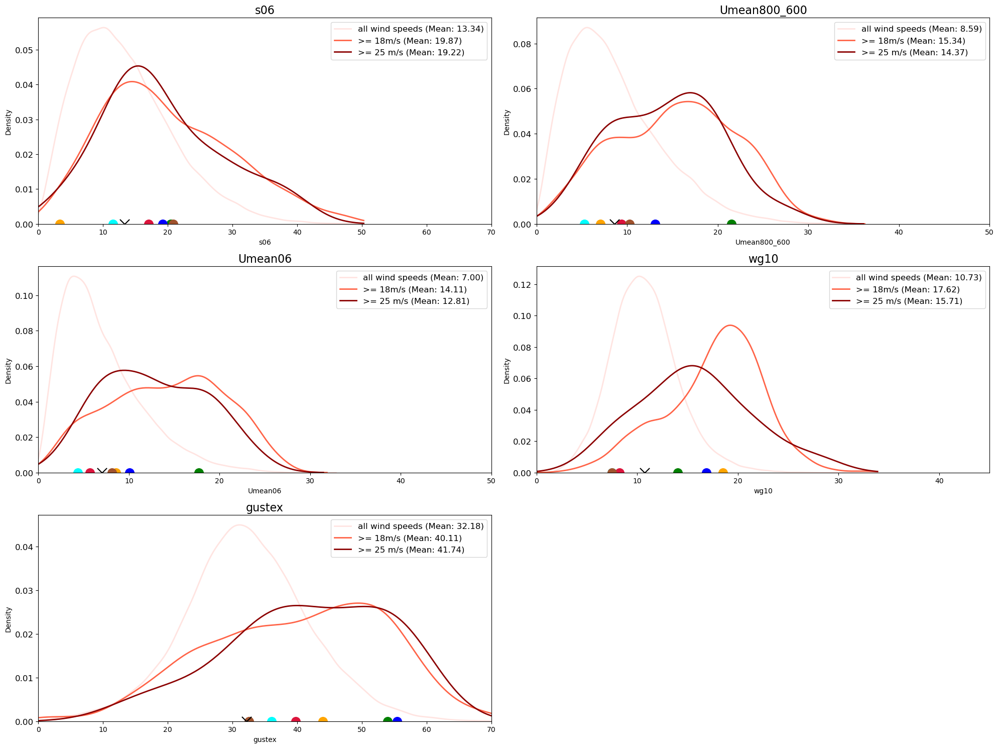

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings

#['ml_cape', 'mu_cape',  'eff_cape', 'lr13', 
 #                 'qmean01', 'rhmin03',  'ml_el', 
  #                't_totals',  'dcape', 'ddraft_temp', 'sfc_thetae',  'ebwd', 
#                  's06',  'Umean800_600', 
   #               'Umean06', 'wg10', 'dcp', 'scp',  
#                  'gustex', 'sherb', 'k_index', 
    #              'bdsd', 'inverted_v', 'ta900','rh900' ]

# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables_ws = merged_df_all_ws.columns  # Assuming columns represent variables

num_vars = len(variables_ws)
num_cols = 2
num_rows = (num_vars + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

custom_x_limits = {
     #'ebwd': (0, 50), 
    's06': (0, 70), 'Umean800_600': (0, 50), 
    'Umean06': (0, 50),  'wg10': (0, 45), 
    #'scp': (0, 20),
    'gustex': (0, 70)
    # Add more variables as needed
}


custom_x_ticks = {
     #'ebwd': np.arange(0, 51, 10), 
     's06': np.arange(0, 71, 10), 
     'Umean800_600': np.arange(0, 51, 10), 
     'Umean06': np.arange(0, 51, 10), 
     'wg10': np.arange(0, 45, 10),
     #'scp': np.arange(0, 21, 4), 
    'gustex': np.arange(0, 71, 10)

    # Add more variables as needed
}

for i, variable in enumerate(variables_ws):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col]

    max_value = max(merged_df_all_ws[variable].max(), merged_df_strong_ws[variable].max(), merged_df_extreme_ws[variable].max())
    # Adjust xlims and xticks based on the variable
    ax.set_xlim(custom_x_limits[variable])
    ax.set_xticks(custom_x_ticks[variable])

    clip_range = (0, max_value)  # Default clip range
    
    means = []  # Empty list to store means for each dataset
    labels = []  # Empty list to store labels for legend
    
    for dataset, color, labell in zip([merged_df_all_ws[variable], merged_df_strong_ws[variable], merged_df_extreme_ws[variable]], 
                                     ['mistyrose', 'tomato', 'darkred'], 
                                     ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
        mean = np.mean(dataset)
        
        means.append(mean)
        labels.append(f'{labell} (Mean: {"%.2f" % mean})')

        sns.kdeplot(data=dataset, color=color, ax=ax, lw=2, clip=clip_range)

    # Add scatter points for arrays a, b, and c
    for j, array in enumerate([ri_ws_0, sy_ws_0, mo_ws_0, bd_ws_0, wa_ws_0, tm_ws_0]):
        if i < len(array):  # Check if the array has enough elements for this subplot
            ax.scatter(array[i], 0, color=['green', 'blue', 'cyan', 'crimson', 'orange', 'sienna'][j], s=160)

    # Add a cross mark to indicate the mean of "all wind speeds"
    ax.scatter(np.mean(merged_df_all_ws[variable]), 0, marker='x', color='black', s=190)
    
    ax.set_title(variable, fontsize=16)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(labels, loc='upper right', fontsize=12)

# Hide empty subplots
for i in range(num_vars, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

## printing mean values for all speeds

In [60]:
import numpy as np
import pandas as pd

# Your existing code for plotting KDEs and calculating means
# Make sure you have 'merged_df_all', 'merged_df_strong', and 'merged_df_extreme' dataframes defined

# Assuming you have already defined variables_mp, custom_x_limits, and custom_x_ticks

all_wind_speed_means = []

for variable in variables_ws:
    all_wind_speed_mean = np.mean(merged_df_all_ws[variable])
    all_wind_speed_means.append(all_wind_speed_mean)

all_wind_speed_means_array = np.array(all_wind_speed_means)

print("Mean values for 'all wind speeds' category as an array:")
print(all_wind_speed_means_array)

Mean values for 'all wind speeds' category as an array:
[13.339765  8.590634  6.99653  10.730373 32.18122 ]


## Moisture parameters

In [61]:
import pandas as pd

# List of diagnostics columns to merge
diagnostics_mp = [
                'rh900', 'rhmin03', 'qmean01', 'q_melting' ]


# List of DataFrames
dataframes_all = [new_frame_wa_nad, new_frame_sy_nad, new_frame_ri_nad, 
              new_frame_bd_nad,new_frame_tm_nad, new_frame_mo_nad]  # Add your DataFrames here

dataframes_strong = [wa_strong_nad, sy_strong_nad, ri_strong_nad, 
              bd_strong_nad,tm_strong_nad, mo_strong_nad]

dataframes_extreme = [wa_extreme_nad, sy_extreme_nad, ri_extreme_nad, 
              bd_extreme_nad,tm_extreme_nad, mo_extreme_nad]

# Merge columns for each diagnostic
merged_diagnostics_all = {}
for diagnostic in diagnostics_mp:
    merged_column_all = pd.concat([df[diagnostic] for df in dataframes_all], axis=0, ignore_index=True)
    merged_diagnostics_all[diagnostic] = merged_column_all

merged_diagnostics_strong = {}
for diagnostic in diagnostics_mp:
    merged_column_strong = pd.concat([df[diagnostic] for df in dataframes_strong], axis=0, ignore_index=True)
    merged_diagnostics_strong[diagnostic] = merged_column_strong

merged_diagnostics_extreme = {}
for diagnostic in diagnostics_mp:
    merged_column_extreme = pd.concat([df[diagnostic] for df in dataframes_extreme], axis=0, ignore_index=True)
    merged_diagnostics_extreme[diagnostic] = merged_column_extreme

# Create a new DataFrame with merged columns for all diagnostics
merged_df_all_mp = pd.DataFrame(merged_diagnostics_all)
merged_df_strong_mp = pd.DataFrame(merged_diagnostics_strong)
merged_df_extreme_mp = pd.DataFrame(merged_diagnostics_extreme)

In [62]:
import numpy as np

# List of variables
variables_mp = ['rh900', 'rhmin03', 'qmean01', 'q_melting' ]

# Initialize an empty dictionary to store arrays of values for each variable
values_dict_bd = {}
values_dict_ri = {}
values_dict_tm = {}
values_dict_sy = {}
values_dict_mo = {}
values_dict_wa = {}

# Loop through each variable
for variable in variables_mp:
    # Initialize an empty list to store values for the current variable
    variable_values_bd = []
    variable_values_ri = []
    variable_values_tm = []
    variable_values_mo = []
    variable_values_wa = []
    variable_values_sy = []
    # Append values for each variable to the list
    variable_values_bd.append(df_bd[df_bd['time'] == '2016-01-28T05:00:00'][variable].values)
    variable_values_sy.append(df_ri[df_ri['time'] == '2001-12-03T02:00:00'][variable].values)
    variable_values_mo.append(df_sy[df_sy['time'] == '2016-01-14T04:00:00'][variable].values)
    variable_values_ri.append(df_mo[df_mo['time'] == '2015-12-16T08:00:00'][variable].values)
    variable_values_tm.append(df_tm[df_tm['time'] == '2017-02-17T07:00:00'][variable].values)
    variable_values_wa.append(df_wa[df_wa['time'] == '2009-01-20T05:00:00'][variable].values)
    # Store the list of values for the current variable in the dictionary
    values_dict_bd[variable] = variable_values_bd
    values_dict_ri[variable] = variable_values_ri
    values_dict_sy[variable] = variable_values_sy
    values_dict_tm[variable] = variable_values_tm
    values_dict_wa[variable] = variable_values_wa
    values_dict_mo[variable] = variable_values_mo

In [63]:
## Values at x=0 for blobs

ri_mp_0 = np.array([30.375, 22.710938, 8.990234, 4.060547])
sy_mp_0 = np.array([44.74999, 29.726562, 13.427734, 6.607422])
mo_mp_0 = np.array([32.875004, 23.827148, 7.1015625, 5.6152344])
bd_mp_0 = np.array([72.75, 52.274414, 12.474609, 1.59375])
wa_mp_0 = np.array([30.625004, 17.77539, 8.2109375, 4.7490234])
tm_mp_0 = np.array([32.374992, 32.375, 11.452148, 5.2158203])

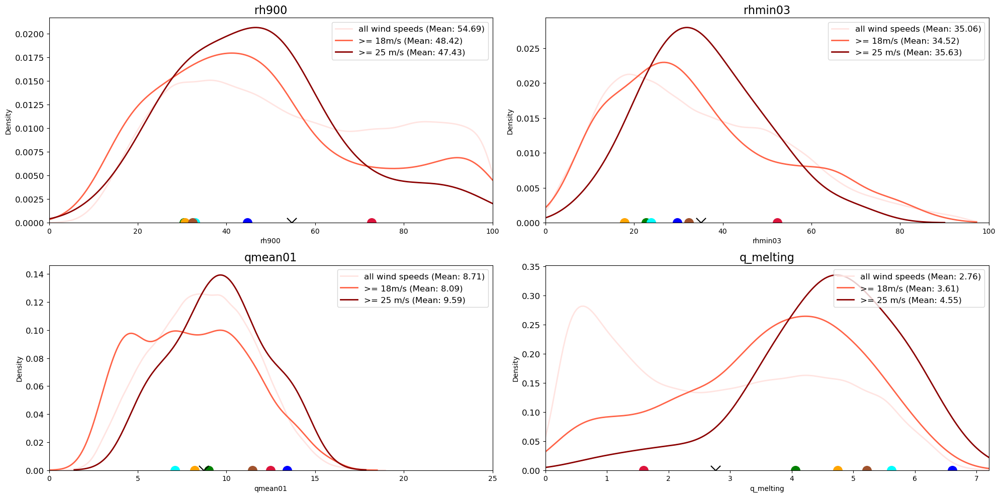

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings

# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables_mp = merged_df_all_mp.columns  # Assuming columns represent variables

num_vars = len(variables_mp)
num_cols = 2
num_rows = (num_vars + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

custom_x_limits = {
    'qmean01': (0, 25),
    'rhmin03': (0, 100),  'q_melting': (0, 7.2),
     'rh900': (0, 100),
    # Add more variables as needed
}

custom_x_ticks = {
  
    'qmean01': np.arange(0, 26, 5),
    'rhmin03': np.arange(0, 101, 20),
     'q_melting': np.arange(0, 7.3, 1),
    'rh900': np.arange(0, 101, 20)
    # Add more variables as needed
}

for i, variable in enumerate(variables_mp):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col]

    max_value = max(merged_df_all_mp[variable].max(), merged_df_strong_mp[variable].max(), merged_df_extreme_mp[variable].max())
    # Adjust xlims and xticks based on the variable
    ax.set_xlim(custom_x_limits[variable])
    ax.set_xticks(custom_x_ticks[variable])

    clip_range = (0, max_value)  # Default clip range
    
    means = []  # Empty list to store means for each dataset
    labels = []  # Empty list to store labels for legend
    
    for dataset, color, labell in zip([merged_df_all_mp[variable], merged_df_strong_mp[variable], merged_df_extreme_mp[variable]], 
                                     ['mistyrose', 'tomato', 'darkred'], 
                                     ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
        mean = np.mean(dataset)
        
        means.append(mean)
        labels.append(f'{labell} (Mean: {"%.2f" % mean})')

        sns.kdeplot(data=dataset, color=color, ax=ax, lw=2, clip=clip_range)

    # Add scatter points for arrays a, b, and c
    for j, array in enumerate([ri_mp_0, sy_mp_0, mo_mp_0, bd_mp_0, wa_mp_0, tm_mp_0]):
        if i < len(array):  # Check if the array has enough elements for this subplot
            ax.scatter(array[i], 0, color=['green', 'blue', 'cyan', 'crimson', 'orange', 'sienna'][j], s=160)

    # Add a cross mark to indicate the mean of "all wind speeds"
    ax.scatter(np.mean(merged_df_all_mp[variable]), 0, marker='x', color='black', s=190)
    
    ax.set_title(variable, fontsize=16)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(labels, loc='upper right', fontsize=12)

# Hide empty subplots
for i in range(num_vars, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

## printing all moisture mean values

In [66]:
import numpy as np
import pandas as pd

# Your existing code for plotting KDEs and calculating means
# Make sure you have 'merged_df_all', 'merged_df_strong', and 'merged_df_extreme' dataframes defined

# Assuming you have already defined variables_mp, custom_x_limits, and custom_x_ticks

all_wind_speed_means = []

for variable in variables_mp:
    all_wind_speed_mean = np.mean(merged_df_all_mp[variable])
    all_wind_speed_means.append(all_wind_speed_mean)

all_wind_speed_means_array = np.array(all_wind_speed_means)

print("Mean values for 'all wind speeds' category as an array:")
print(all_wind_speed_means_array)


Mean values for 'all wind speeds' category as an array:
[54.68803   35.06019    8.709416   2.7649298]


### Instability parameters

In [70]:
import pandas as pd

# List of diagnostics columns to merge
diagnostics_is = [ 'mu_cape',  'dcape', 
               'ta900',   'lr13', 't_totals', 'k_index', 'inverted_v',
                 'ml_el',  'dcp', 'bdsd' ]


# List of DataFrames
dataframes_all = [new_frame_wa_nad, new_frame_sy_nad, new_frame_ri_nad, 
              new_frame_bd_nad,new_frame_tm_nad, new_frame_mo_nad]  # Add your DataFrames here

dataframes_strong = [wa_strong_nad, sy_strong_nad, ri_strong_nad, 
              bd_strong_nad,tm_strong_nad, mo_strong_nad]

dataframes_extreme = [wa_extreme_nad, sy_extreme_nad, ri_extreme_nad, 
              bd_extreme_nad,tm_extreme_nad, mo_extreme_nad]

# Merge columns for each diagnostic
merged_diagnostics_all = {}
for diagnostic in diagnostics_is:
    merged_column_all = pd.concat([df[diagnostic] for df in dataframes_all], axis=0, ignore_index=True)
    merged_diagnostics_all[diagnostic] = merged_column_all

merged_diagnostics_strong = {}
for diagnostic in diagnostics_is:
    merged_column_strong = pd.concat([df[diagnostic] for df in dataframes_strong], axis=0, ignore_index=True)
    merged_diagnostics_strong[diagnostic] = merged_column_strong

merged_diagnostics_extreme = {}
for diagnostic in diagnostics_is:
    merged_column_extreme = pd.concat([df[diagnostic] for df in dataframes_extreme], axis=0, ignore_index=True)
    merged_diagnostics_extreme[diagnostic] = merged_column_extreme

# Create a new DataFrame with merged columns for all diagnostics
merged_df_all_is = pd.DataFrame(merged_diagnostics_all)
merged_df_strong_is = pd.DataFrame(merged_diagnostics_strong)
merged_df_extreme_is = pd.DataFrame(merged_diagnostics_extreme)

In [71]:
import numpy as np

# List of variables
variables_is = [ 'mu_cape',  'dcape', 
               'ta900',   'lr13', 't_totals', 'k_index', 'inverted_v',
                 'ml_el',  'dcp', 'bdsd' ]


# Initialize an empty dictionary to store arrays of values for each variable
values_dict_bd = {}
values_dict_ri = {}
values_dict_tm = {}
values_dict_sy = {}
values_dict_mo = {}
values_dict_wa = {}

# Loop through each variable
for variable in variables_is:
    # Initialize an empty list to store values for the current variable
    variable_values_bd = []
    variable_values_ri = []
    variable_values_tm = []
    variable_values_mo = []
    variable_values_wa = []
    variable_values_sy = []
    # Append values for each variable to the list
    variable_values_bd.append(df_bd[df_bd['time'] == '2016-01-28T05:00:00'][variable].values)
    variable_values_sy.append(df_ri[df_ri['time'] == '2001-12-03T02:00:00'][variable].values)
    variable_values_mo.append(df_sy[df_sy['time'] == '2016-01-14T04:00:00'][variable].values)
    variable_values_ri.append(df_mo[df_mo['time'] == '2015-12-16T08:00:00'][variable].values)
    variable_values_tm.append(df_tm[df_tm['time'] == '2017-02-17T07:00:00'][variable].values)
    variable_values_wa.append(df_wa[df_wa['time'] == '2009-01-20T05:00:00'][variable].values)
    # Store the list of values for the current variable in the dictionary
    values_dict_bd[variable] = variable_values_bd
    values_dict_ri[variable] = variable_values_ri
    values_dict_sy[variable] = variable_values_sy
    values_dict_tm[variable] = variable_values_tm
    values_dict_wa[variable] = variable_values_wa
    values_dict_mo[variable] = variable_values_mo

In [72]:
## Values at x=0 for blobs

ri_mp_0 = np.array([2065.5, 1184.1875, 27.600006, 8.6953125, 54.043945, 
                    30.873047, 23.36089, 11225.8125, 5.325174, 1.0])
sy_mp_0 = np.array([3548.375, 779.6875, 28.225006, 8.873047, 52.180664,
                    43.838867, 19.253288, 13358.0625, 3.217396, 1.0])
mo_mp_0 = np.array([280.625, 976.125, 23.975006, 9.374023, 50.20117, 
                    36.29297, 25.695118, 9321.0, 0.08293709, 0.921875])
bd_mp_0 = np.array([1230.125, 861.0625, 19.975006, 6.451172, 46.908203, 
                    23.189453, -20.618708, 8786.75, 0.6173986, 0.4375])
wa_mp_0 = np.array([788.0, 1262.1875, 27.475006, 9.05957, 51.615234, 
                    35.83496, 23.651434, 8171.5625, 0.16878782, 0.859375])
tm_mp_0 = np.array([2241.5, 859.0, 25.350006, 7.8164062, 48.086914, 30.375977, 
                    14.180969, 9314.4375, 1.9654429, 0.8515625])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings


# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables_td = merged_df_all.columns  # Assuming columns represent variables

num_vars = len(variables_td)
num_cols = 3
num_rows = (num_vars + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

custom_x_limits = {
    'ml_cape': (0, 4000), 'mu_cape': (0, 5000),
    'eff_cape': (0, 4000), 'lr13': (0, 10.5), 
    'ml_el': (0, 16000), 'mlcape*s06': (0, 400000),
    't_totals': (0, 70), 'dcape': (0, 3000), 
     'dcp': (0, 20),  'eff_sherb': (0, 4),  'k_index': (0, 50),'bdsd': (0, 1),
    'inverted_v': (-90, 80),  'ta900': (0, 60)
    # Add more variables as needed
}

custom_x_ticks = {
    'ml_cape': np.arange(0, 4001, 500),
    'mu_cape': np.arange(0, 5001, 1000),
    'eff_cape': np.arange(0, 4001, 500),
    'lr13': np.arange(0, 10.6, 2),
    
    'ml_el': np.arange(0, 16005, 3000),
     'mlcape*s06': np.arange(0, 400005, 100000),
     't_totals': np.arange(0, 71, 10),
     'dcape': np.arange(0, 3001, 500),
     
    'dcp': np.arange(0, 21, 4),
     'scp': np.arange(0, 21, 4),  'eff_sherb': np.arange(0, 4, 1),
    'k_index': np.arange(0, 51, 10),  'bdsd': np.arange(0, 1.15, 0.25),
    'inverted_v': np.arange(-90, 81, 20),  'ta900': np.arange(0, 61, 20)
    # Add more variables as needed
}

for i, variable in enumerate(variables_td):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col]

    max_value = max(merged_df_all[variable].max(), merged_df_strong[variable].max(), merged_df_extreme[variable].max())
    # Adjust xlims and xticks based on the variable
    ax.set_xlim(custom_x_limits[variable])
    ax.set_xticks(custom_x_ticks[variable])

    clip_range = (0, max_value)  # Default clip range

    if variable == 'inverted_v':
        clip_range = (-90, max_value)
    elif variable == 'sherb':
        clip_range = (0, 3.5)
    

    
    means = []  # Empty list to store means for each dataset
    labels = []  # Empty list to store labels for legend
    
    for dataset, color, labell in zip([merged_df_all[variable], merged_df_strong[variable], merged_df_extreme[variable]], 
                                     ['mistyrose', 'tomato', 'darkred'], 
                                     ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
        mean = np.mean(dataset)
        
        means.append(mean)
        labels.append(f'{labell} (Mean: {"%.2f" % mean})')

        sns.kdeplot(data=dataset, color=color, ax=ax, lw=2, clip=clip_range)

    # Add scatter points for arrays a, b, and c
    for j, array in enumerate([ri_td_0, sy_td_0, mo_td_0, bd_td_0, wa_td_0, tm_td_0]):
        if i < len(array):  # Check if the array has enough elements for this subplot
            ax.scatter(array[i], 0, color=['green', 'blue', 'cyan', 'crimson', 'orange', 'sienna'][j], s=160)

    # Add a cross mark to indicate the mean of "all wind speeds"
    ax.scatter(np.mean(merged_df_all[variable]), 0, marker='x', color='black', s=190)
    
    ax.set_title(variable, fontsize=16)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(labels, loc='upper right', fontsize=12)

# Hide empty subplots
for i in range(num_vars, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

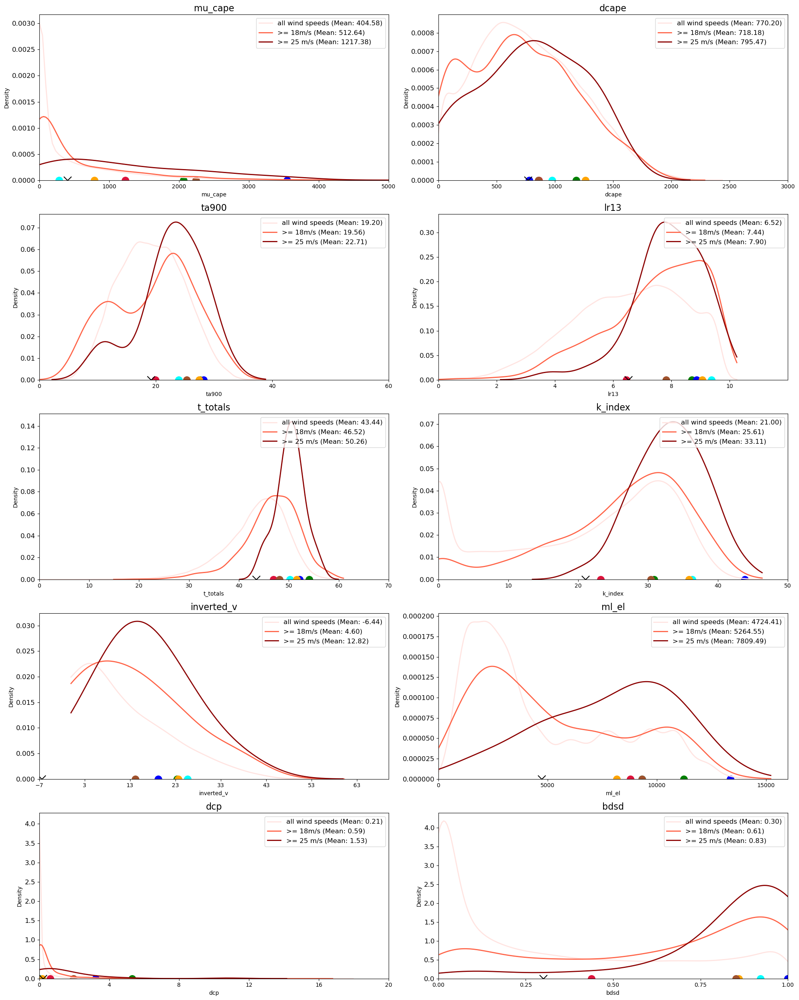

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings

# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables_is = merged_df_all_is.columns  # Assuming columns represent variables

num_vars = len(variables_is)
num_cols = 2
num_rows = (num_vars + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

custom_x_limits = {
    #'ml_cape': (0, 4000), 
    'mu_cape': (0, 5000),
    'lr13': (0, 12), 
    'ml_el': (0, 16000), 
    't_totals': (0, 70), 'dcape': (0, 3000), 
     'dcp': (0, 20),  'k_index': (0, 50), 'bdsd': (0, 1),
    'inverted_v': (-7, 70),  'ta900': (0, 60)
    # Add more variables as needed
}

custom_x_ticks = {
    
    'mu_cape': np.arange(0, 5001, 1000),
    
    'lr13': np.arange(0, 12, 2),
   
    'ml_el': np.arange(0, 16005, 5000),
    
     't_totals': np.arange(0, 71, 10),
     'dcape': np.arange(0, 3001, 500),
    
    'dcp': np.arange(0, 21, 4),
    
    'k_index': np.arange(0, 51, 10),  'bdsd': np.arange(0, 1.1, 0.25),
    'inverted_v': np.arange(-7, 71, 10),  'ta900': np.arange(0, 61, 20)
  
    # Add more variables as needed
}

for i, variable in enumerate(variables_is):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col]

    max_value = max(merged_df_all_is[variable].max(), merged_df_strong_is[variable].max(), merged_df_extreme_is[variable].max())
    # Adjust xlims and xticks based on the variable
    ax.set_xlim(custom_x_limits[variable])
    ax.set_xticks(custom_x_ticks[variable])

    clip_range = (0, max_value)  # Default clip range
    
    means = []  # Empty list to store means for each dataset
    labels = []  # Empty list to store labels for legend
    
    for dataset, color, labell in zip([merged_df_all_is[variable], merged_df_strong_is[variable], merged_df_extreme_is[variable]], 
                                     ['mistyrose', 'tomato', 'darkred'], 
                                     ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
        mean = np.mean(dataset)
        
        means.append(mean)
        labels.append(f'{labell} (Mean: {"%.2f" % mean})')

        sns.kdeplot(data=dataset, color=color, ax=ax, lw=2, clip=clip_range)

    # Add scatter points for arrays a, b, and c
    for j, array in enumerate([ri_mp_0, sy_mp_0, mo_mp_0, bd_mp_0, wa_mp_0, tm_mp_0]):
        if i < len(array):  # Check if the array has enough elements for this subplot
            ax.scatter(array[i], 0, color=['green', 'blue', 'cyan', 'crimson', 'orange', 'sienna'][j], s=160)

    # Add a cross mark to indicate the mean of "all wind speeds"
    ax.scatter(np.mean(merged_df_all_is[variable]), 0, marker='x', color='black', s=190)
    
    ax.set_title(variable, fontsize=16)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(labels, loc='upper right', fontsize=12)

# Hide empty subplots
for i in range(num_vars, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

In [67]:
import pandas as pd

# List of diagnostics columns to merge
# diagnostics = ['ml_cape', 'mu_cape', 'eff_cape', 'lr13', 
#                   'qmean01', 'rhmin03',  'ml_el', 
#                   't_totals',  'dcape', 'q_melting', 'sfc_thetae', 'ebwd',  's06',  'Umean800_600', 
#                   'Umean06', 'wg10', 'dcp', 'scp',  'gustex', 'sherb', 'k_index', 
#                   'bdsd', 'inverted_v', 'ta900','rh900' ]

diagnostics = ['mu_cape',  'dcape', 
               'ta900',   'lr13', 't_totals', 'k_index', 'inverted_v',
                 'ml_el',  'dcp', 'bdsd' ]


# List of DataFrames
dataframes_all = [new_frame_wa_nad, new_frame_sy_nad, new_frame_ri_nad, 
              new_frame_bd_nad,new_frame_tm_nad, new_frame_mo_nad]  # Add your DataFrames here

dataframes_strong = [wa_strong_nad, sy_strong_nad, ri_strong_nad, 
              bd_strong_nad,tm_strong_nad, mo_strong_nad]

dataframes_extreme = [wa_extreme_nad, sy_extreme_nad, ri_extreme_nad, 
              bd_extreme_nad,tm_extreme_nad, mo_extreme_nad]

# Merge columns for each diagnostic
merged_diagnostics_all = {}
for diagnostic in diagnostics:
    merged_column_all = pd.concat([df[diagnostic] for df in dataframes_all], axis=0, ignore_index=True)
    merged_diagnostics_all[diagnostic] = merged_column_all

merged_diagnostics_strong = {}
for diagnostic in diagnostics:
    merged_column_strong = pd.concat([df[diagnostic] for df in dataframes_strong], axis=0, ignore_index=True)
    merged_diagnostics_strong[diagnostic] = merged_column_strong

merged_diagnostics_extreme = {}
for diagnostic in diagnostics:
    merged_column_extreme = pd.concat([df[diagnostic] for df in dataframes_extreme], axis=0, ignore_index=True)
    merged_diagnostics_extreme[diagnostic] = merged_column_extreme

# Create a new DataFrame with merged columns for all diagnostics
merged_df_all = pd.DataFrame(merged_diagnostics_all)
merged_df_strong = pd.DataFrame(merged_diagnostics_strong)
merged_df_extreme = pd.DataFrame(merged_diagnostics_extreme)

In [68]:
import numpy as np

# List of variables
variables = ['mu_cape',  'dcape', 
               'ta900',   'lr13', 't_totals', 'k_index', 'inverted_v',
                 'ml_el',  'dcp', 'bdsd' ]

# Initialize an empty dictionary to store arrays of values for each variable
values_dict_bd = {}
values_dict_ri = {}
values_dict_tm = {}
values_dict_sy = {}
values_dict_mo = {}
values_dict_wa = {}

# Loop through each variable
for variable in variables:
    # Initialize an empty list to store values for the current variable
    variable_values_bd = []
    variable_values_ri = []
    variable_values_tm = []
    variable_values_mo = []
    variable_values_wa = []
    variable_values_sy = []
    # Append values for each variable to the list
    variable_values_bd.append(df_bd[df_bd['time'] == '2016-01-28T05:00:00'][variable].values)
    variable_values_sy.append(df_ri[df_ri['time'] == '2001-12-03T02:00:00'][variable].values)
    variable_values_mo.append(df_sy[df_sy['time'] == '2016-01-14T04:00:00'][variable].values)
    variable_values_ri.append(df_mo[df_mo['time'] == '2015-12-16T08:00:00'][variable].values)
    variable_values_tm.append(df_tm[df_tm['time'] == '2017-02-17T07:00:00'][variable].values)
    variable_values_wa.append(df_wa[df_wa['time'] == '2009-01-20T05:00:00'][variable].values)
    # Store the list of values for the current variable in the dictionary
    values_dict_bd[variable] = variable_values_bd
    values_dict_ri[variable] = variable_values_ri
    values_dict_sy[variable] = variable_values_sy
    values_dict_tm[variable] = variable_values_tm
    values_dict_wa[variable] = variable_values_wa
    values_dict_mo[variable] = variable_values_mo

# Now, values_dict contains arrays of values for each variable


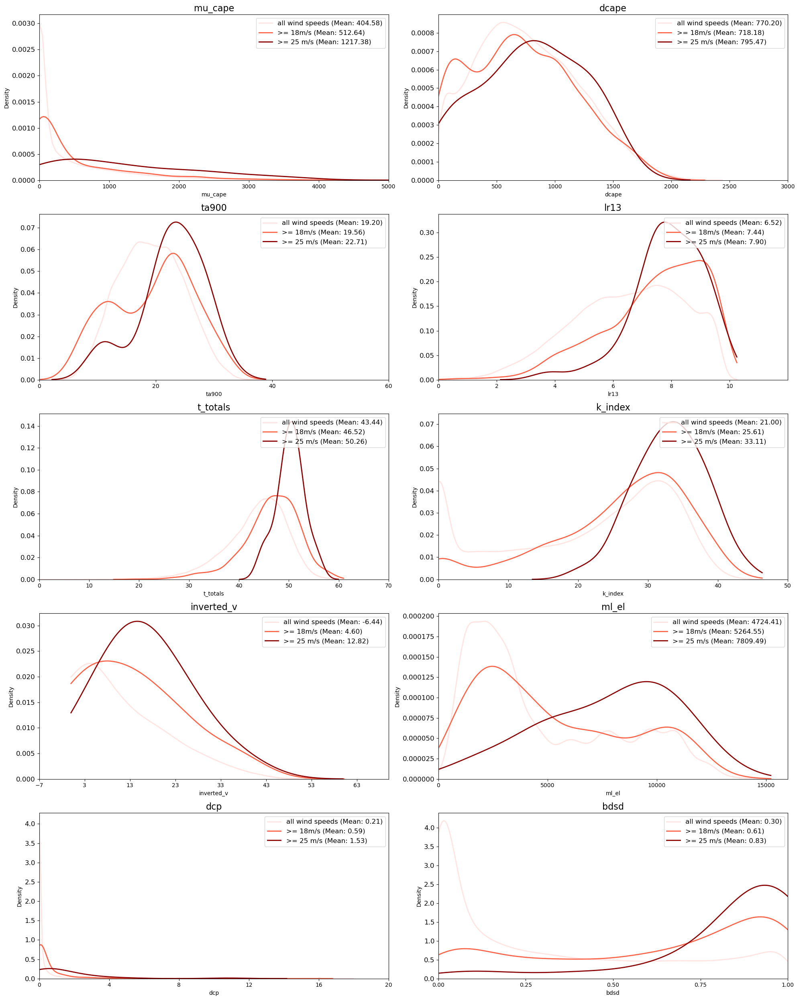

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings

#['ml_cape', 'mu_cape',  'eff_cape', 'lr13', 
 #                 'qmean01', 'rhmin03',  'ml_el', 
  #                't_totals',  'dcape', 'ddraft_temp', 'sfc_thetae',  'ebwd', 
#                  's06',  'Umean800_600', 
   #               'Umean06', 'wg10', 'dcp', 'scp',  
#                  'gustex', 'sherb', 'k_index', 
    #              'bdsd', 'inverted_v', 'ta900','rh900' ]

# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables = merged_df_all.columns  # Assuming columns represent variables

num_vars = len(variables)
num_cols = 2
num_rows = (num_vars + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

custom_x_limits = {
    #'ml_cape': (0, 4000), 
    'mu_cape': (0, 5000),
    'lr13': (0, 12), 
    'ml_el': (0, 16000), 
    't_totals': (0, 70), 'dcape': (0, 3000), 
     'dcp': (0, 20),  'k_index': (0, 50), 'bdsd': (0, 1),
    'inverted_v': (-7, 70),  'ta900': (0, 60)
    # Add more variables as needed
}

custom_x_ticks = {
    
    'mu_cape': np.arange(0, 5001, 1000),
    
    'lr13': np.arange(0, 12, 2),
   
    'ml_el': np.arange(0, 16005, 5000),
    
     't_totals': np.arange(0, 71, 10),
     'dcape': np.arange(0, 3001, 500),
    
    'dcp': np.arange(0, 21, 4),
    
    'k_index': np.arange(0, 51, 10),  'bdsd': np.arange(0, 1.1, 0.25),
    'inverted_v': np.arange(-7, 71, 10),  'ta900': np.arange(0, 61, 20)
  
    # Add more variables as needed
}

for i, variable in enumerate(variables):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col]

    max_value = max(merged_df_all[variable].max(), merged_df_strong[variable].max(), merged_df_extreme[variable].max())
    # Adjust xlims and xticks based on the variable
    ax.set_xlim(custom_x_limits[variable])
    ax.set_xticks(custom_x_ticks[variable])
    
    #medians = []
    means = []
    #stds = []
    labels = []

    for dataset, color, label in zip([merged_df_all[variable], merged_df_strong[variable], merged_df_extreme[variable]], 
                                     ['mistyrose', 'tomato', 'darkred'], 
                                     ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
        #median = np.median(dataset)
        mean = np.mean(dataset)
        # std = np.std(dataset)
        # medians.append(median)
        means.append(mean)
        #stds.append(std)
        labels.append(f'{label} (Mean: {"%.2f" % mean})')
        
        sns.kdeplot(data=dataset, color=color, ax=ax, 
                    lw=2,  
                    clip=(0, max_value)
                   )

    ax.set_title(variable, fontsize=16)
    
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(labels, loc='upper right', fontsize=12)

# Hide empty subplots
for i in range(num_vars, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

# Assuming merged_df_all, merged_df_strong, and merged_df_extreme are your dataframes
variables = merged_df_all.columns  # Assuming columns represent variables

means_array = []

for variable in variables:
    means = []

    for dataset in [merged_df_all[variable], merged_df_strong[variable], merged_df_extreme[variable]]:
        mean = np.mean(dataset)
        means.append(mean)

    means_array.append(means)

means_array = np.array(means_array)
print(means_array)


In [ ]:
means_first_values = means_array[:, 0]
print(means_first_values)


## Decision tree 

In [63]:
#Creating a csv file with all the variables and wind speeds


In [51]:
merged_df_all_td

,ml_cape,mu_cape,eff_cape,dcape,ta900,mlcape*s06,lr13,t_totals,k_index,inverted_v,ml_el,dcp,eff_sherb,bdsd
0,0.0,0.0,0.0,523.8750,17.100006,0.0,6.380859,39.312500,16.567383,3.226060,2610.1250,0.0,0.0,0.007812
1,0.0,0.0,0.0,558.3125,18.350006,0.0,6.745117,40.488281,15.728516,-0.202211,2777.7500,0.0,0.0,0.015625
2,0.0,0.0,0.0,737.1875,19.350006,0.0,6.983398,42.206055,14.804688,-3.170978,2973.7500,0.0,0.0,0.015625
3,0.0,0.0,0.0,1095.3125,20.475006,0.0,7.273438,45.108398,13.415039,-8.009457,2919.7500,0.0,0.0,0.031250
4,0.0,0.0,0.0,1164.5000,21.350006,0.0,7.443359,45.863281,12.267578,-7.650257,3074.8750,0.0,0.0,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89292,0.0,0.0,0.0,1031.2500,18.850006,0.0,6.209961,44.625000,7.688477,-10.235996,2123.7500,0.0,0.0,0.007812
89293,0.0,0.0,0.0,977.6875,19.975006,0.0,7.121094,45.410156,17.970703,-15.728537,2340.1250,0.0,0.0,0.015625
89294,0.0,0.0,0.0,1226.7500,20.725006,0.0,7.839844,46.178711,28.539062,-8.709711,2437.2500,0.0,0.0,0.125000
89295,0.0,0.0,0.0,1089.5000,21.100006,0.0,8.690430,46.154297,33.555664,1.337561,2496.9375,0.0,0.0,0.296875


In [52]:
# Merge DataFrames by column
new_merged_df = pd.concat([merged_df_all_td, merged_df_all_mp, merged_df_all_ws], axis=1)

new_merged_df

,ml_cape,mu_cape,eff_cape,dcape,ta900,mlcape*s06,lr13,t_totals,k_index,inverted_v,...,rhmin03,qmean01,q_melting,ebwd,s06,Umean800_600,Umean06,wg10,scp,gustex
0,0.0,0.0,0.0,523.8750,17.100006,0.0,6.380859,39.312500,16.567383,3.226060,...,22.750977,5.409180,2.236328,0.0,3.093750,2.546875,2.046875,11.375,0.0,24.593750
1,0.0,0.0,0.0,558.3125,18.350006,0.0,6.745117,40.488281,15.728516,-0.202211,...,20.844727,5.341797,1.881836,0.0,3.406250,2.132812,2.093750,10.625,0.0,24.956055
2,0.0,0.0,0.0,737.1875,19.350006,0.0,6.983398,42.206055,14.804688,-3.170978,...,18.839844,5.132812,1.564453,0.0,3.648438,2.078125,2.179688,9.250,0.0,25.207031
3,0.0,0.0,0.0,1095.3125,20.475006,0.0,7.273438,45.108398,13.415039,-8.009457,...,20.088867,5.789062,1.275391,0.0,6.742188,3.757812,3.000000,6.875,0.0,28.668945
4,0.0,0.0,0.0,1164.5000,21.350006,0.0,7.443359,45.863281,12.267578,-7.650257,...,18.624023,5.600586,1.142578,0.0,6.468750,4.164062,3.226562,6.375,0.0,28.149414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89292,0.0,0.0,0.0,1031.2500,18.850006,0.0,6.209961,44.625000,7.688477,-10.235996,...,13.875000,8.047852,2.879883,0.0,10.007812,4.148438,3.351562,8.250,0.0,31.838867
89293,0.0,0.0,0.0,977.6875,19.975006,0.0,7.121094,45.410156,17.970703,-15.728537,...,27.633789,7.663086,1.443359,0.0,9.757812,4.023438,3.312500,8.000,0.0,31.912109
89294,0.0,0.0,0.0,1226.7500,20.725006,0.0,7.839844,46.178711,28.539062,-8.709711,...,26.314453,7.620117,2.198242,0.0,11.875000,4.687500,3.406250,9.875,0.0,32.806641
89295,0.0,0.0,0.0,1089.5000,21.100006,0.0,8.690430,46.154297,33.555664,1.337561,...,27.844727,7.535156,3.878906,0.0,8.507812,2.851562,3.398438,9.500,0.0,32.488281


In [ ]:
import numpy as np
import pandas as pd

# Load your hourly data into a DataFrame
# Replace 'data.csv' with your actual file path
data = pd.read_csv('data.csv')

# List of variables to analyze
variables = ['temperature', 'variable1', 'variable2', 'variable3', ...]  # Add your variable names here

# Assuming 'wind_speed' is the column name for wind speed data in your DataFrame
wind_speed_threshold = 25  # Threshold for wind speed exceeding 25 m/s

# Create an empty DataFrame to store the results
results = pd.DataFrame(columns=['Variable', 'Temperature Percentile', 'Chance of Wind Speed > 25 m/s'])

# Loop through each variable
for variable in variables:
    # Calculate percentiles of the current variable data
    variable_percentiles = np.percentile(data[variable], np.arange(0, 101, 10))
    
    # Loop through each temperature percentile range
    for i in range(len(variable_percentiles) - 1):
        # Define the temperature percentile range
        min_temp = variable_percentiles[i]
        max_temp = variable_percentiles[i + 1]
        
        # Filter data within the temperature percentile range
        filtered_data = data[
            (data[variable] >= min_temp) & 
            (data[variable] < max_temp)
        ]
        
        # Calculate the probability of wind speed exceeding 25 m/s
        probability = len(filtered_data[filtered_data['wind_speed'] > wind_speed_threshold]) / len(filtered_data)
        
        # Append the results to the DataFrame
        results = results.append({'Variable': variable, 'Temperature Percentile': f"{min_temp}-{max_temp}", 'Chance of Wind Speed > 25 m/s': probability}, ignore_index=True)

# Print the results
print(results)


# Kernel density estimate

# mlcape

In [ ]:
# Merge columns from the three DataFrames into a single column
merged_column = pd.concat([ri_tot_nad['ri_mlcape'], sy_tot_nad['sy_mlcape'], 
                           mo_tot_nad['mo_mlcape'], tm_tot_nad['tm_mlcape'],
                           wa_tot_nad['wa_mlcape'], be_tot_nad['be_mlcape']], axis=0, ignore_index=True)

# Create a new DataFrame with the merged column
merged_df = pd.DataFrame({'MLCAPE': merged_column})

In [ ]:
# Merge columns from the three DataFrames into a single column
merged_column2 = pd.concat([ri_tot_se_nad['ri_mlcape'], sy_tot_se_nad['sy_mlcape'], 
                           mo_tot_se_nad['mo_mlcape'], tm_tot_se_nad['tm_mlcape'],
                           wa_tot_se_nad['wa_mlcape'], be_tot_se_nad['be_mlcape']], axis=0, ignore_index=True)

# Create a new DataFrame with the merged column
merged_df2 = pd.DataFrame({'MLCAPE': merged_column2})

In [ ]:
# Merge columns from the three DataFrames into a single column
merged_column3 = pd.concat([ri_tot_25_nad['ri_mlcape'], sy_tot_25_nad['sy_mlcape'], 
                           mo_tot_25_nad['mo_mlcape'], tm_tot_25_nad['tm_mlcape'],
                           wa_tot_25_nad['wa_mlcape'], be_tot_25_nad['be_mlcape']], axis=0, ignore_index=True)

# Create a new DataFrame with the merged column
merged_df3 = pd.DataFrame({'MLCAPE': merged_column3})

In [ ]:
# List to store the values
values_list = []

# Append values to the list
values_list.append(be_tot_nad[be_tot_nad['barra_time'] == '2016-01-28T05:00:00']['be_mlcape'].values)
values_list.append(ri_tot_nad[ri_tot_nad['barra_time'] == '2001-12-03T02:00:00']['ri_mlcape'].values)
values_list.append(sy_tot_nad[sy_tot_nad['barra_time'] == '2016-01-14T04:00:00']['sy_mlcape'].values)
values_list.append(mo_tot_nad[mo_tot_nad['barra_time'] == '2015-12-16T08:00:00']['mo_mlcape'].values)
values_list.append(tm_tot_nad[tm_tot_nad['barra_time'] == '2017-02-17T07:00:00']['tm_mlcape'].values)
values_list.append(wa_tot_nad[wa_tot_nad['barra_time'] == '2009-01-20T05:00:00']['wa_mlcape'].values)

# Convert the list to a NumPy array
values_array = np.array(values_list)
values_array 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
#warnings.filterwarnings("ignore")

# Assuming merged_df, merged_df2, and merged_df3 are your dataframes
fig, ax = plt.subplots(figsize=(9, 4))

# Annotate median for each KDE
count = 0
medians = []
means = []
stds = []
labels = []

for dataset, color, label in zip([merged_df, merged_df2, merged_df3], ['mistyrose', 'tomato', 'darkred'], ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
    count += 1
    median = np.median(dataset)
    mean = np.mean(dataset)
    std = np.std(dataset)
    kde_data = sns.kdeplot(data=dataset).get_lines()[0].get_data()
    medians.append(median)
    means.append(mean)
    stds.append(std)
    labels.append(f'{label} ( Mean: {"%.2f" % mean})')
    #labels.append(f'{label} (Median: {"%.2f" % median}, Mean: {"%.2f" % mean}, Std: {"%.2f" % std})')

# Change linestyle and add label to each KDE plot
sns.kdeplot(data=merged_df, color='mistyrose', palette=['mistyrose'],  ax=ax, lw=4)
sns.kdeplot(data=merged_df2, color='tomato', palette=['tomato'],  ax=ax, lw=4)
sns.kdeplot(data=merged_df3, color='darkred', palette=['darkred'],ax=ax, lw=4)

legend_entries = [plt.Line2D([0], [0], color='mistyrose', lw=4),
                  plt.Line2D([0], [0], color='tomato', lw=4),
                  plt.Line2D([0], [0], color='darkred', lw=4)]

ax.legend(legend_entries, labels, loc='upper right', fontsize=13)

ax.set_xlabel('MLCAPE (j/kg)', fontsize=16)
ax.set_ylabel('Density', fontsize=16)

ax.set_title('MLCAPE', fontsize = 16)

ax.set_xticks(np.arange(0, 2100, 500))
ax.set_xticklabels(['0', '500', '1000', '1500', '2000'], fontsize=16)

# Modify the size of y-ticks
ax.tick_params(axis='y', labelsize=16)

# Mark the numbers on the x-axis with a cross mark and specified colors
x_positions = values_array  # Modify these positions as needed
colors = ['crimson', 'green', 'blue', 'cyan', 'sienna', 'orange']

for i, (x, color) in enumerate(zip(x_positions, colors)):
    ax.plot(x, 0, 'o', color=color, markersize=15)
plt.tight_layout()
plt.show()

In [ ]:
merged_df.describe()

In [ ]:
# Merge columns from the three DataFrames into a single column
merged_column2 = pd.concat([ri_k_se_nad['ri_k']-273.15, sy_k_se_nad['sy_k']-273.15, 
                           mo_k_se_nad['mo_k']-273.15, tm_k_se_nad['tm_k']-273.15,
                           be_k_se_nad['be_k']-273.15, wa_k_se_nad['wa_k']-273.15], axis=0, ignore_index=True)

# Create a new DataFrame with the merged column
merged_df2 = pd.DataFrame({'K-index': merged_column2})
#print(merged_df2)

In [ ]:
# Merge columns from the three DataFrames into a single column
merged_column3 = pd.concat([ri_k_25_nad['ri_k']-273.15, sy_k_25_nad['sy_k']-273.15, 
                           mo_k_25_nad['mo_k']-273.15, tm_k_25_nad['tm_k']-273.15,
                           be_k_25_nad['be_k']-273.15, wa_k_25_nad['wa_k']-273.15], axis=0, ignore_index=True)

# Create a new DataFrame with the merged column
merged_df3 = pd.DataFrame({'K-index': merged_column3})
#print(merged_df3)

In [ ]:
# List to store the values
values_list = []

# Append values to the list
values_list.append((be_k_nad[be_k_nad['barra_time'] == '2016-01-28T05:00:00']['be_k'].values) - 273.15)
values_list.append((ri_k_nad[ri_k_nad['barra_time'] == '2001-12-03T02:00:00']['ri_k'].values)- 273.15)
values_list.append((sy_k_nad[sy_k_nad['barra_time'] == '2016-01-14T04:00:00']['sy_k'].values)- 273.15)
values_list.append((mo_k_nad[mo_k_nad['barra_time'] == '2015-12-16T08:00:00']['mo_k'].values)- 273.15)
values_list.append((tm_k_nad[tm_k_nad['barra_time'] == '2017-02-17T07:00:00']['tm_k'].values)- 273.15)
values_list.append((wa_k_nad[wa_k_nad['barra_time'] == '2009-01-20T05:00:00']['wa_k'].values)- 273.15)

# Convert the list to a NumPy array
values_array = np.array(values_list)
values_array 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
#warnings.filterwarnings("ignore")

# Assuming merged_df, merged_df2, and merged_df3 are your dataframes
fig, ax = plt.subplots(figsize=(12, 6))

# Annotate median for each KDE
count = 0
medians = []
means = []
stds = []
labels = []

for dataset, color, label in zip([merged_df, merged_df2, merged_df3], ['mistyrose', 'tomato', 'darkred'], ['all wind speeds', '>= 18m/s', '>= 25 m/s']):
    count += 1
    median = np.median(dataset)
    mean = np.mean(dataset)
    std = np.std(dataset)
    kde_data = sns.kdeplot(data=dataset).get_lines()[0].get_data()
    medians.append(median)
    means.append(mean)
    stds.append(std)
    labels.append(f'{label} (Median: {"%.2f" % median}, Mean: {"%.2f" % mean}, Std: {"%.2f" % std})')

# Change linestyle and add label to each KDE plot
sns.kdeplot(data=merged_df, color='mistyrose', palette=['mistyrose'],  ax=ax, lw=4)
sns.kdeplot(data=merged_df2, color='tomato', palette=['tomato'],  ax=ax, lw=4)
sns.kdeplot(data=merged_df3, color='darkred', palette=['darkred'],ax=ax, lw=4)

legend_entries = [plt.Line2D([0], [0], color='mistyrose', lw=4),
                  plt.Line2D([0], [0], color='tomato', lw=4),
                  plt.Line2D([0], [0], color='darkred', lw=4)]

ax.legend(legend_entries, labels, loc='upper left', fontsize=10)

ax.set(xlabel='K-index', ylabel='Density')

ax.set_title('K-index')

ax.set_xticks(np.arange(-70, 60, 10))

# Mark the numbers on the x-axis with a cross mark and specified colors
x_positions = values_array  # Modify these positions as needed
colors = ['crimson', 'green', 'blue', 'cyan', 'sienna', 'orange']

for i, (x, color) in enumerate(zip(x_positions, colors)):
    ax.plot(x, 0, 'o', color=color, markersize=15)
plt.tight_layout()
plt.show()
